In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import xlrd

In [4]:
data = pd.read_csv("BankChurners.csv")

In [5]:
data.sample(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
8264,789151983,Existing Customer,43,F,4,Graduate,Unknown,$40K - $60K,Blue,31,...,4091.0,1108,2983.0,0.774,5244,87,0.706,0.271,0.000317,0.999680
1404,710798883,Existing Customer,52,M,3,Graduate,Single,$60K - $80K,Blue,44,...,3323.0,2310,1013.0,0.749,1599,47,0.808,0.695,0.000339,0.999660
2005,718577958,Attrited Customer,39,M,2,Uneducated,Married,$120K +,Blue,26,...,8906.0,0,8906.0,0.315,809,15,0.250,0.000,0.998120,0.001880
9212,711826983,Attrited Customer,47,F,3,Unknown,Married,$40K - $60K,Blue,36,...,5822.0,0,5822.0,0.655,3240,38,0.652,0.000,0.999440,0.000559
7924,780360558,Existing Customer,33,F,1,Graduate,Married,Less than $40K,Blue,20,...,1507.0,0,1507.0,0.723,4698,87,0.851,0.000,0.000107,0.999890
3746,714162033,Existing Customer,45,F,3,Post-Graduate,Divorced,Less than $40K,Blue,28,...,5216.0,1519,3697.0,0.887,3434,49,0.690,0.291,0.000446,0.999550
8918,717382608,Existing Customer,59,M,1,Graduate,Single,$60K - $80K,Silver,36,...,26692.0,2517,24175.0,0.796,8780,86,0.654,0.094,0.000097,0.999900
5911,709487058,Existing Customer,51,F,2,Unknown,Married,Less than $40K,Silver,36,...,13812.0,1132,12680.0,0.699,3723,56,0.867,0.082,0.000190,0.999810
1426,709267308,Existing Customer,62,M,1,Graduate,Married,$80K - $120K,Blue,49,...,2437.0,1400,1037.0,0.779,1651,32,1.000,0.574,0.000052,0.999950
1738,708623283,Existing Customer,35,M,2,Uneducated,Single,$60K - $80K,Blue,16,...,18278.0,0,18278.0,0.798,2084,61,1.103,0.000,0.000185,0.999820


In [6]:
data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

### Dropped unnecessary coloumns

In [7]:
columns_to_drop = ['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']
data = data.drop(columns=columns_to_drop)

In [8]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [9]:
data['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [11]:
data1 = data[['Attrition_Flag', 'Avg_Utilization_Ratio']]
data1.head(3)

,Attrition_Flag,Avg_Utilization_Ratio
0,Existing Customer,0.061
1,Existing Customer,0.105
2,Existing Customer,0.000


In [12]:
data1['Attrition_Flag'] = data1['Attrition_Flag'].apply(lambda x: x.split()[0])
data1.head(4)

/var/folders/qr/9x6pfw9d58vf78nhsqtb93mh0000gn/T/ipykernel_819/1130166443.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Attrition_Flag'] = data1['Attrition_Flag'].apply(lambda x: x.split()[0])


,Attrition_Flag,Avg_Utilization_Ratio
0,Existing,0.061
1,Existing,0.105
2,Existing,0.000
3,Existing,0.760


In [13]:
atr = data1[data1['Attrition_Flag'] == 'Attrited'] 
atr['Avg_Utilization_Percent'] = atr['Avg_Utilization_Ratio'].apply(lambda x: x*100)
atr = atr.drop('Avg_Utilization_Ratio', axis = 1)
atr.head(4)

/var/folders/qr/9x6pfw9d58vf78nhsqtb93mh0000gn/T/ipykernel_819/1161305794.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atr['Avg_Utilization_Percent'] = atr['Avg_Utilization_Ratio'].apply(lambda x: x*100)


,Attrition_Flag,Avg_Utilization_Percent
21,Attrited,0.0
39,Attrited,7.7
51,Attrited,56.2
54,Attrited,0.0


In [14]:
# Define the bins or ranges
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# Used pd.cut to categorize values into bins
atr['Ratio_Category'] = pd.cut(atr['Avg_Utilization_Percent'], bins=bins)

# Got the count of occurrences in each bin
count_in_ranges = atr['Ratio_Category'].value_counts()

atr.sample(4)

,Attrition_Flag,Avg_Utilization_Percent,Ratio_Category
8999,Attrited,0.5,"(0.0, 10.0]"
8022,Attrited,0.0,NaN
9408,Attrited,0.0,NaN
5155,Attrited,0.0,NaN


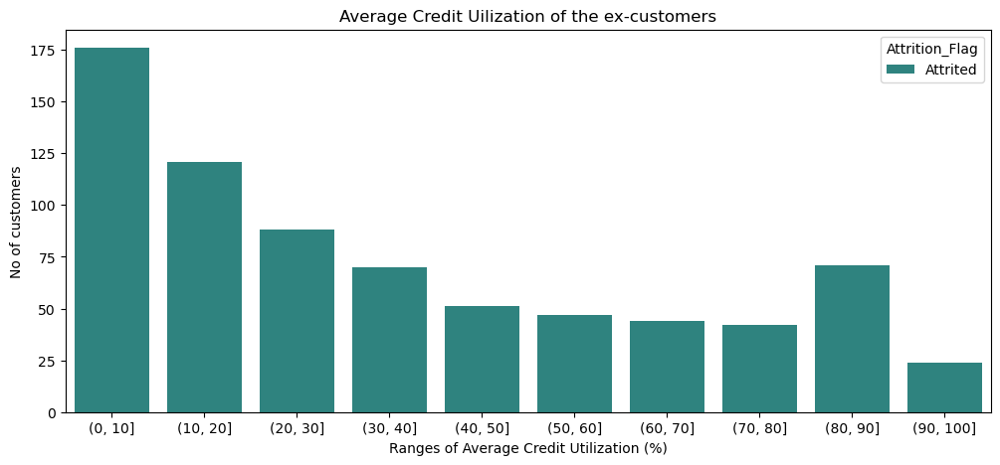

In [15]:
plt.figure(figsize=(12, 5))
sns.countplot(x='Ratio_Category', data=atr, hue='Attrition_Flag', palette='viridis')
plt.title('Average Credit Uilization of the ex-customers')
plt.xlabel('Ranges of Average Credit Utilization (%)')
plt.ylabel('No of customers')
plt.show()

 - **Inference**
 
Most ex-customers have used their card **below 10%**. 
- Firstly,  what we learned from our dataset is the income group of **40-60k USD** is predominant. The lesser the income the lesser becomes the card usage and expense.
- Secondly, the more a person utilizes the card to a higher limit it becomes more difficult to get par with the interest rates.
- Thirdly, there may be reluctancy to use the card from these customers because they wanted to drop the cards.

In [16]:
exs = data1[data1['Attrition_Flag'] == 'Existing'] 
exs['Avg_Utilization_Percent'] = exs['Avg_Utilization_Ratio'].apply(lambda x: x*100)
exs = exs.drop('Avg_Utilization_Ratio', axis = 1)
exs.head(3)

/var/folders/qr/9x6pfw9d58vf78nhsqtb93mh0000gn/T/ipykernel_819/1784544994.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exs['Avg_Utilization_Percent'] = exs['Avg_Utilization_Ratio'].apply(lambda x: x*100)


,Attrition_Flag,Avg_Utilization_Percent
0,Existing,6.1
1,Existing,10.5
2,Existing,0.0


In [17]:
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100] #bins are left closed right open

# Used pd.cut to categorize values into bins
exs['Ratio_Category'] = pd.cut(exs['Avg_Utilization_Percent'], bins=bins)

# Getting the count of occurrences in each bin
count_in_ranges = exs['Ratio_Category'].value_counts()



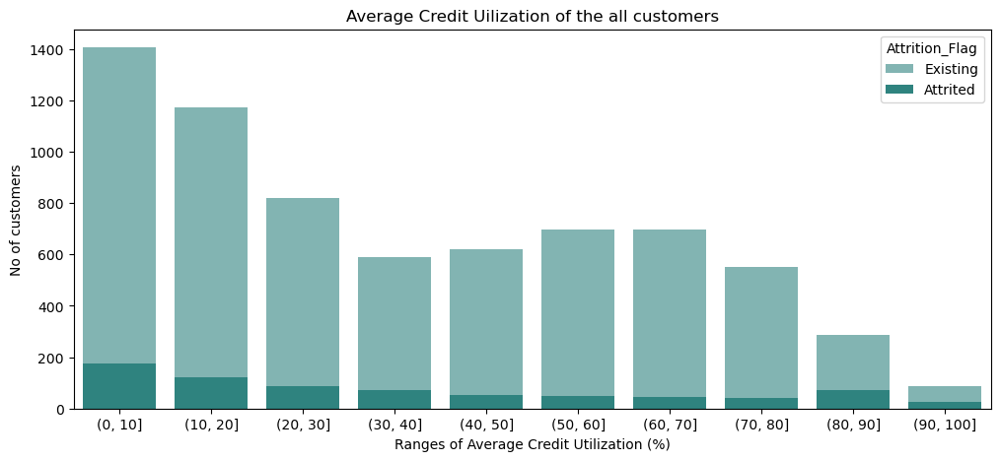

In [18]:
plt.figure(figsize=(12, 5))
sns.countplot(x='Ratio_Category', data=exs, hue='Attrition_Flag', palette='viridis', alpha = 0.6)
sns.countplot(x='Ratio_Category', data=atr, hue='Attrition_Flag', palette='viridis')
plt.title('Average Credit Uilization of the all customers')
plt.xlabel('Ranges of Average Credit Utilization (%)')
plt.ylabel('No of customers')
plt.show()

 - **Inference**
 
Most customers have used their card **below 10%**. However, there is another rise around **50% - 70%**
- No of attrited or ex-customers are way lesser than the present customers.
- This plot is more influenced by the existing customers. Existing customers have used the cards more than the ex-customer as they wanted to continue using the cards.

# Customers & Card Types

In [19]:
data = pd.read_csv("BankChurners.csv")

In [20]:
data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [21]:
card_gen = data[['Gender', 'Card_Category']]
card_gen.head(3)

,Gender,Card_Category
0,M,Blue
1,F,Blue
2,M,Blue


## Genderwise Distribution of Cards

In [22]:
male_cards = card_gen[card_gen['Gender'] == "M"]
male_cards_final = male_cards['Card_Category'].value_counts()
male_cards_final = pd.DataFrame(male_cards_final)
male_cards_final

,count
Card_Category,
Blue,4335
Silver,345
Gold,78
Platinum,11


In [23]:
female_cards = card_gen[card_gen['Gender'] == "F"]
female_cards_final = female_cards['Card_Category'].value_counts()
female_cards_final = pd.DataFrame(female_cards_final)
female_cards_final

,count
Card_Category,
Blue,5101
Silver,210
Gold,38
Platinum,9


In [24]:
mf_card = pd.merge(female_cards_final, male_cards_final, on = 'Card_Category')

In [25]:
mf_card.rename(columns={'count_y': 'Male', 'count_x': 'Female'}, inplace=True)

In [26]:
mf_card.reset_index(inplace = True) #very crucial
mf_card

,Card_Category,Female,Male
0,Blue,5101,4335
1,Silver,210,345
2,Gold,38,78
3,Platinum,9,11


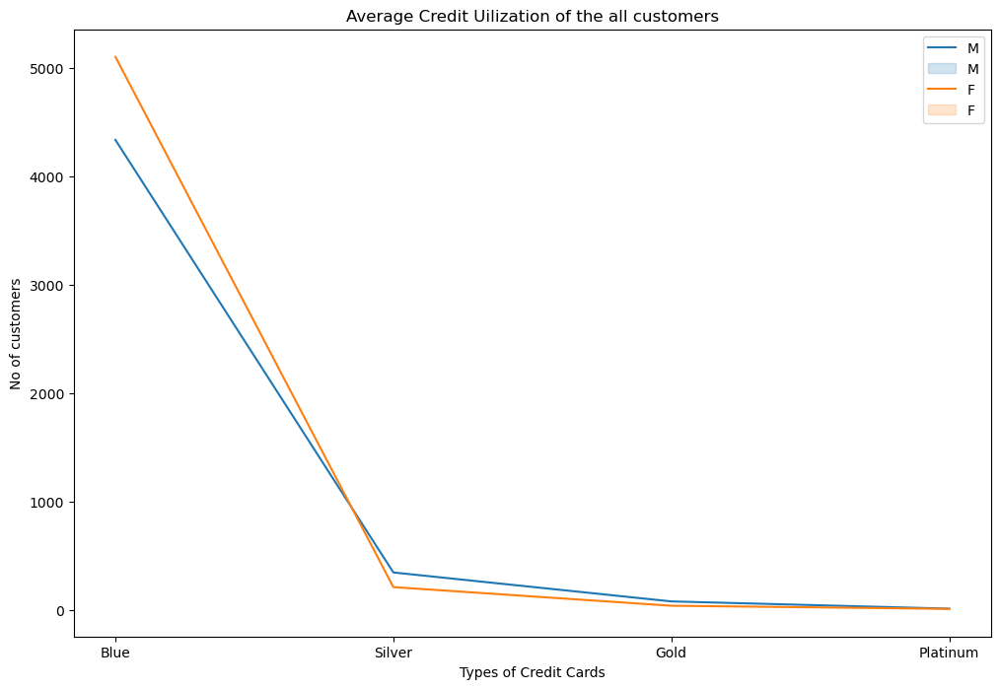

In [27]:
plt.figure(figsize=(12, 8))
sns.lineplot(x='Card_Category', y = 'Male' ,data=mf_card)
sns.lineplot(x='Card_Category', data=mf_card, y = 'Female')
plt.title('Average Credit Uilization of the all customers')
plt.xlabel('Types of Credit Cards')
plt.ylabel('No of customers')
plt.legend('MMFF')
plt.show()

 - **Inference**
 
Surprisingly female customers are having more blue cards than male customers. 
- Firstly, the less charges of the **blue** cards. 
- Secondly, there may have been such cases where husband-wife both use cards, where husband uses higher-tier cards like **Silver, Gold or Platinum**

# Master Dataset

#### From now on the below dataset is solely used in later cases.

In [28]:
e1 = data[['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]

# Card Type and Age

In [42]:
data = pd.read_csv("BankChurners.csv")

In [43]:
c_age = e1[['Customer_Age', 'Income_Category','Card_Category']]
c_age.sample(3)

,Customer_Age,Income_Category,Card_Category
9658,41,$60K - $80K,Blue
6783,50,Less than $40K,Blue
8741,54,$40K - $60K,Blue


In [44]:
bins1 = [0, 20, 30, 40, 50, 60, 70, 80] #bins are left closed right open
c_age['Customer_Age_Classes'] = pd.cut(c_age['Customer_Age'], bins=bins1)
c_age.sample(4)

/var/folders/qr/9x6pfw9d58vf78nhsqtb93mh0000gn/T/ipykernel_1824/1124715423.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c_age['Customer_Age_Classes'] = pd.cut(c_age['Customer_Age'], bins=bins1)


,Customer_Age,Income_Category,Card_Category,Customer_Age_Classes
4070,42,Unknown,Blue,"(40, 50]"
5726,42,$60K - $80K,Blue,"(40, 50]"
3669,50,$60K - $80K,Blue,"(40, 50]"
6500,42,Less than $40K,Blue,"(40, 50]"


## No of Customers in each Age Group


In [45]:
age_count_in_ranges = c_age['Customer_Age_Classes'].value_counts()
age_count_in_ranges.reset_index()

,Customer_Age_Classes,count
0,"(40, 50]",4652
1,"(50, 60]",2673
2,"(30, 40]",2132
3,"(60, 70]",404
4,"(20, 30]",265
5,"(70, 80]",1
6,"(0, 20]",0


 - **Inference**
 
In almost each age group the customers with annual income between **60000** USD and **80000** USD are dominant, followed by group of annual income less than **40000** USD

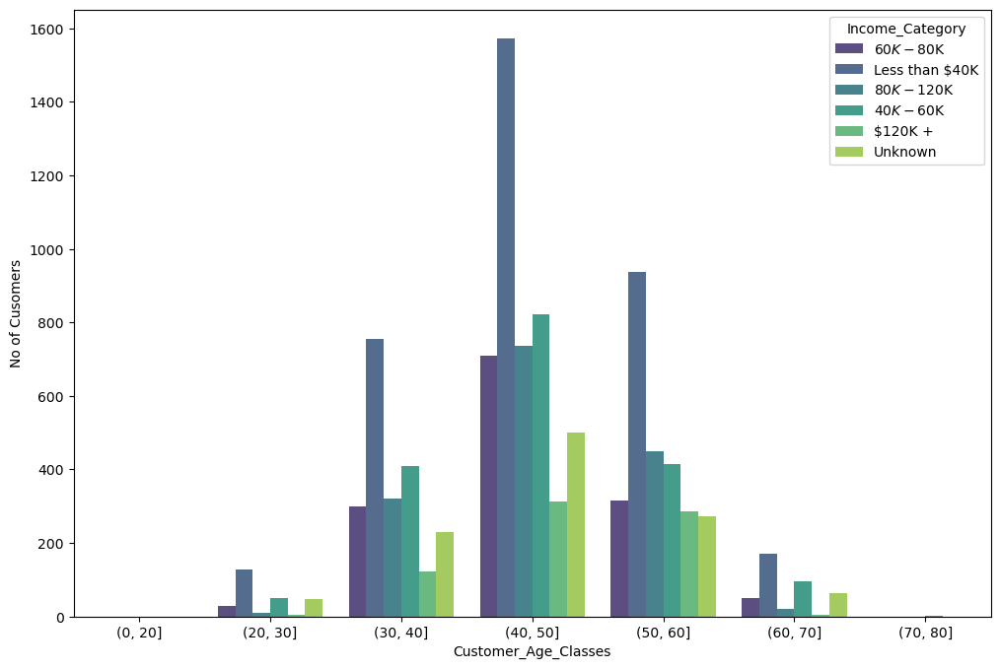

In [46]:
plt.figure(figsize=(12, 8))
sns.countplot(x='Customer_Age_Classes',data=c_age, palette = 'viridis', hue = 'Income_Category', alpha = 0.9)
plt.ylabel('No of Cusomers');

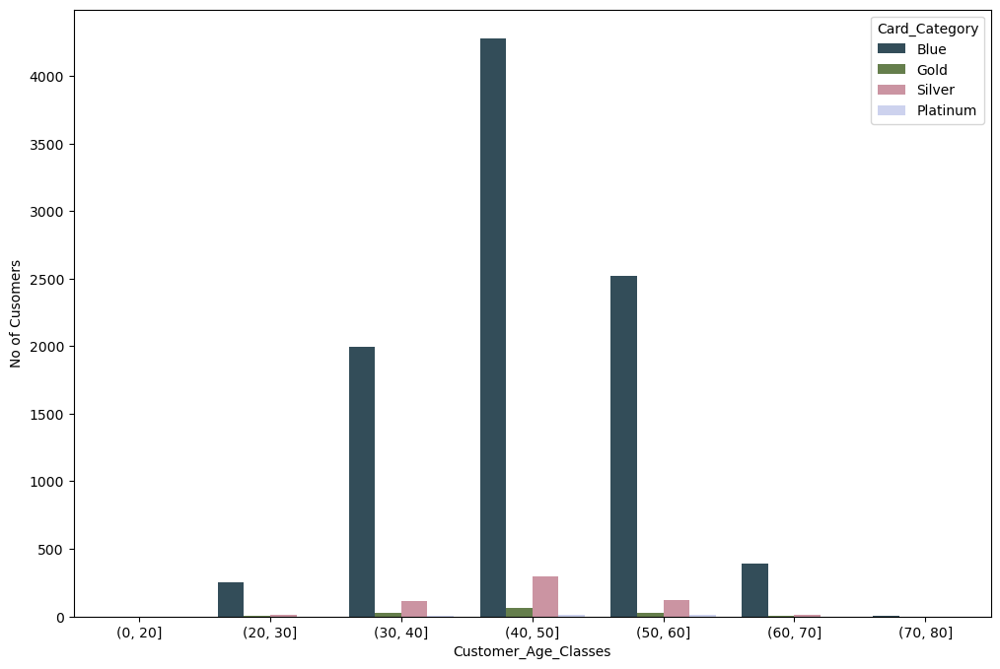

In [47]:
plt.figure(figsize=(12, 8))
sns.countplot(x='Customer_Age_Classes',data=c_age, palette = 'cubehelix', hue = 'Card_Category', alpha = 0.9)
plt.ylabel('No of Cusomers');

 - **Inference**
 
In almost each age group the customers with **Blue** Cards are dominant, followed by **Silver, Gold & Platinum.** This is due to the service charges, annual charges etc. being lesser than the rest of the cards.



# Marital Status vs Credit Limit



In [48]:
main_coloumns = data[['Marital_Status', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Credit_Limit' ]]
main_coloumns.sample(4)

,Marital_Status,Total_Revolving_Bal,Avg_Open_To_Buy,Credit_Limit
362,Single,2274,32242.0,34516.0
4474,Married,916,4995.0,5911.0
112,Divorced,1674,1589.0,3263.0
9873,Single,1642,32874.0,34516.0


In [49]:
grouped_data = main_coloumns.groupby(['Marital_Status']).mean()
grouped_data.apply(lambda x: round(x, 2))

,Total_Revolving_Bal,Avg_Open_To_Buy,Credit_Limit
Marital_Status,,,
Divorced,1155.98,8202.58,9358.57
Married,1197.16,6879.50,8076.66
Single,1124.24,7875.44,8999.68
Unknown,1157.75,8287.53,9445.28


In [50]:
grouped_data.reset_index(inplace = True)
grouped_data

,Marital_Status,Total_Revolving_Bal,Avg_Open_To_Buy,Credit_Limit
0,Divorced,1155.981283,8202.583824,9358.565107
1,Married,1197.163644,6879.498250,8076.661895
2,Single,1124.241441,7875.443317,8999.684758
3,Unknown,1157.748999,8287.534179,9445.283178


In [51]:
data = pd.read_csv("BankChurners.csv")
data.sample(4)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
7948,714424533,Attrited Customer,41,F,4,Graduate,Married,Less than $40K,Blue,36,...,1655.0,0,1655.0,0.496,2156,37,0.194,0.000,0.991690,0.008310
9288,717781608,Existing Customer,52,F,3,Graduate,Married,Less than $40K,Blue,40,...,9230.0,1518,7712.0,0.774,14082,99,0.833,0.164,0.000071,0.999930
9348,709934808,Existing Customer,59,M,1,Unknown,Single,$40K - $60K,Silver,51,...,15164.0,1071,14093.0,0.900,13062,103,0.717,0.071,0.000064,0.999940
4467,708916083,Attrited Customer,49,F,0,Doctorate,Unknown,Less than $40K,Blue,37,...,1749.0,0,1749.0,1.006,2510,38,0.407,0.000,0.995810,0.004188


In [52]:
e1 = data[['Customer_Age','Gender',"Dependent_count", "Attrition_Flag" ,'Education_Level', 'Card_Category', 'Income_Category' ,
           'Marital_Status', 'Total_Revolving_Bal', 'Avg_Open_To_Buy','Credit_Limit', 'Months_on_book', 
           'Avg_Utilization_Ratio', 'Total_Trans_Amt' ,"Total_Trans_Ct",'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon']]
e1.sample(4)

,Customer_Age,Gender,Dependent_count,Attrition_Flag,Education_Level,Card_Category,Income_Category,Marital_Status,Total_Revolving_Bal,Avg_Open_To_Buy,Credit_Limit,Months_on_book,Avg_Utilization_Ratio,Total_Trans_Amt,Total_Trans_Ct,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon
4537,48,F,3,Attrited Customer,Graduate,Blue,Unknown,Single,1243,387.0,1630.0,36,0.763,1884,43,3,3,1
2584,54,M,1,Existing Customer,College,Blue,$60K - $80K,Married,1753,156.0,1909.0,37,0.918,1457,24,6,3,2
9896,44,F,1,Existing Customer,High School,Blue,Less than $40K,Single,1640,4519.0,6159.0,36,0.266,13517,106,3,3,3
1276,26,F,0,Existing Customer,Graduate,Blue,$40K - $60K,Single,1101,542.0,1643.0,13,0.670,2152,50,6,3,4


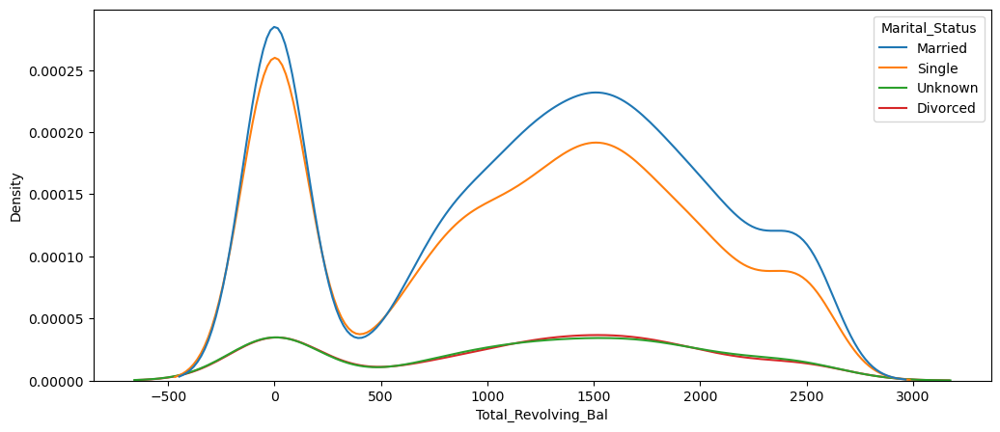

In [53]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Total_Revolving_Bal', hue = 'Marital_Status' );

 - **Inference:**
- Married people are dominant.
- The whole population seemingly has due amount between **1000 - 2500 USD** 

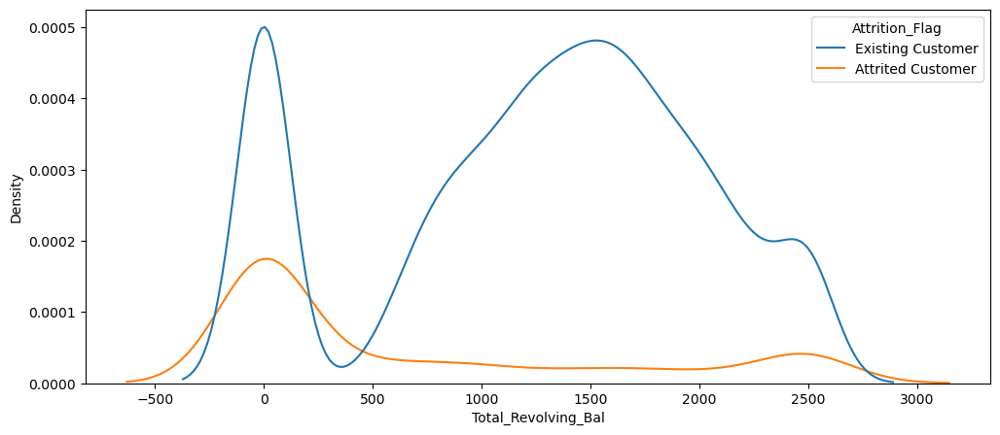

In [54]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Total_Revolving_Bal', hue = 'Attrition_Flag');

 - **Inference:**
- **Existing** customers are dominant.
- The whole population seemingly has due amount between **1000 - 2500 USD** 

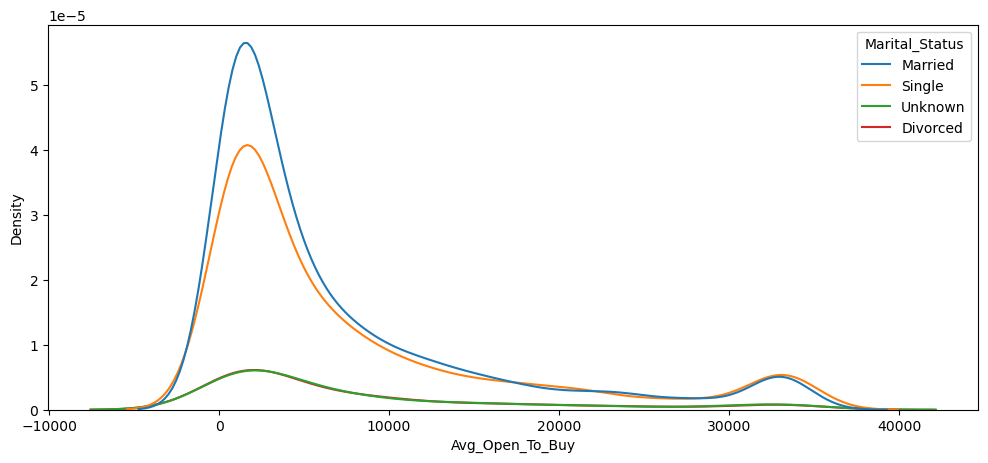

In [55]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Avg_Open_To_Buy', hue = 'Marital_Status');

 - **Inference:**
- A lot of **Married** customers have used their card to the limit.

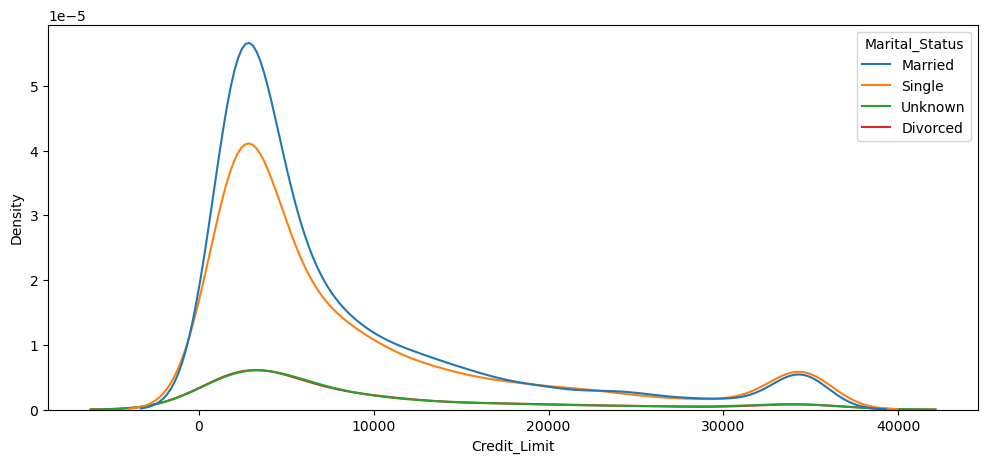

In [56]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Credit_Limit', hue = 'Marital_Status' );

 - **Inference:**
- A lot of **Married** customers have credit limit below **10000 USD**.

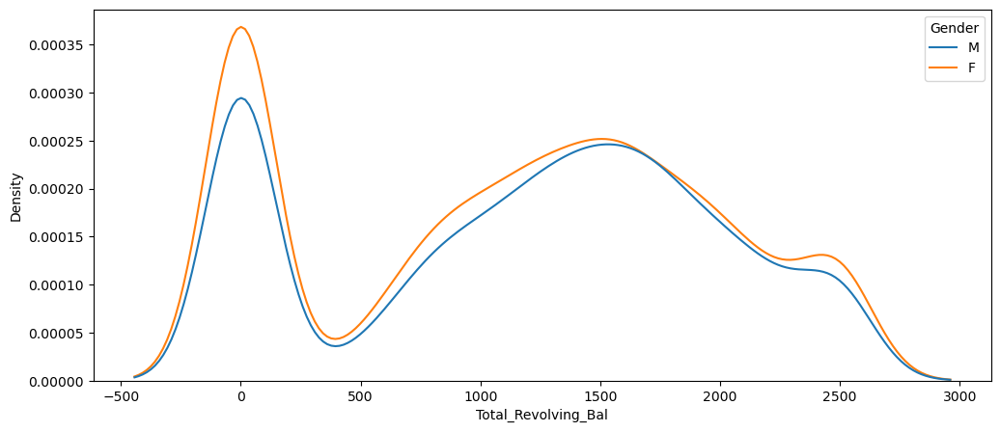

In [57]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Total_Revolving_Bal', hue = 'Gender' );

 - **Inference:**
- A lot of male customers have due balance between **1000 - 2000 USD**.

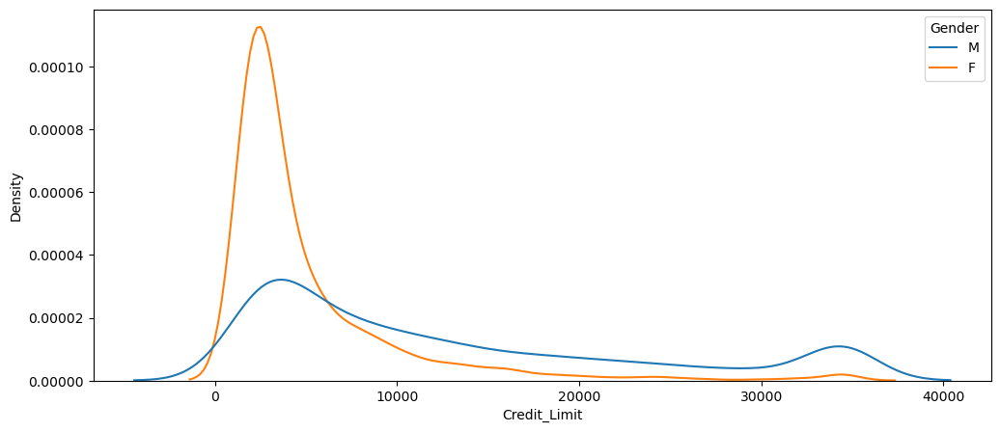

In [58]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Credit_Limit', hue = 'Gender' );

 - **Inference:**
- A lot of **Female** customers have credit limit below **10000 USD**.
- But male customers have their credit limits distributed between the whole range. 

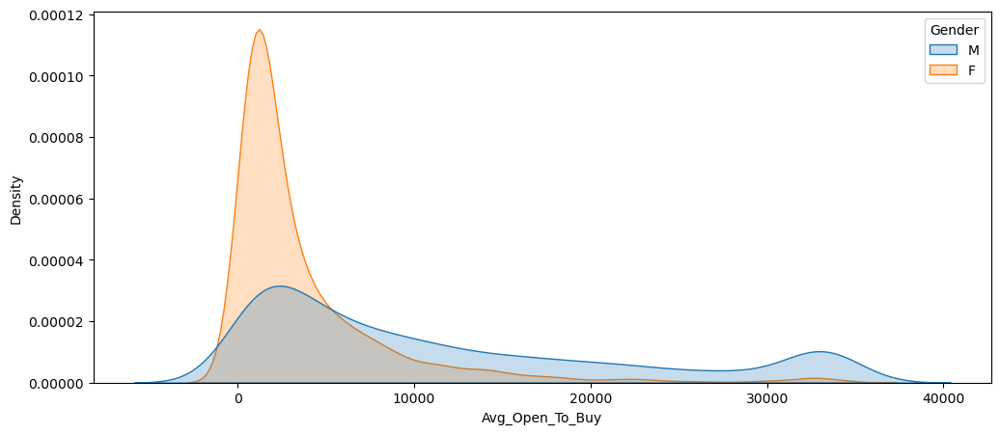

In [59]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Avg_Open_To_Buy', hue = 'Gender', fill = True );

 - **Inference:**
- A lot of **Female** customers have open balance below **10000 USD**.
    - This may happen due to most of them already have low credit limit. A slight usage also will decrease the open balance.
- But male customers have their credit limits distributed between the whole range. 

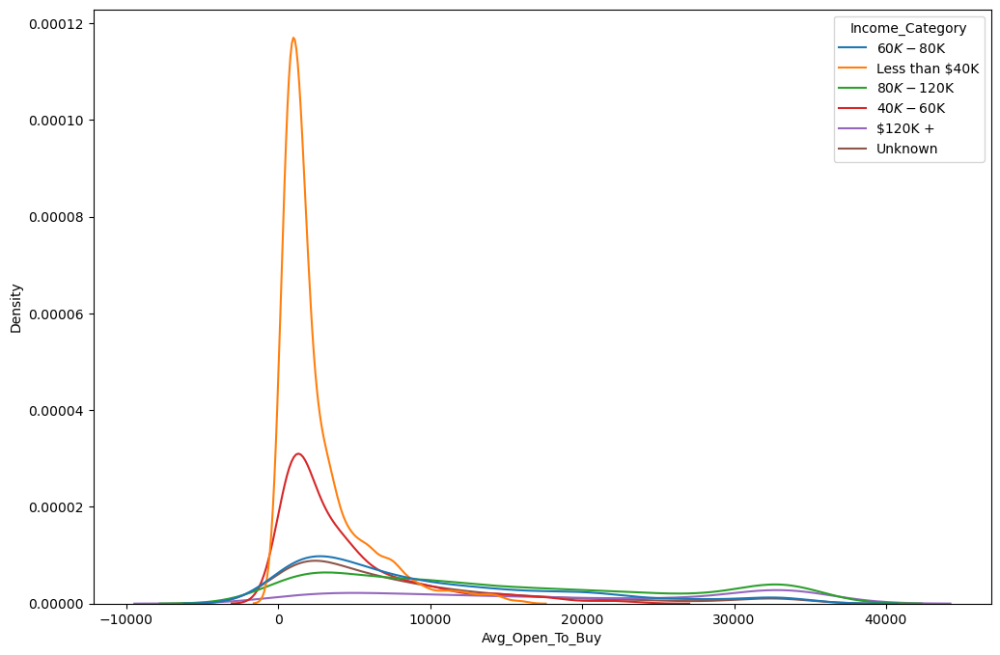

In [60]:
plt.figure(figsize = (12,8))
sns.kdeplot(data = e1, x = 'Avg_Open_To_Buy', hue = 'Income_Category' );

 - **Inference:**

Here are a lot of details in this plot.
- Customers with **less than 40000 USD** annual income are centered around opening balance **0 - 5000 USD.**
    - Reason is they mostly have blue cards with **less credit limit** and eventually lower opening balance due to usage.
    
- Customers with **40000 - 60000 USD** annual income are also centered around opening balance **0 - 5000 USD.** Though they are less in number than the people with less than **40000 USD annual income**


- But there is also a spike in the right-most part with higher opening balance and premium tier cards. As probability or proportion of such users are relatively less, the below graph is rescaled to focus on that part.

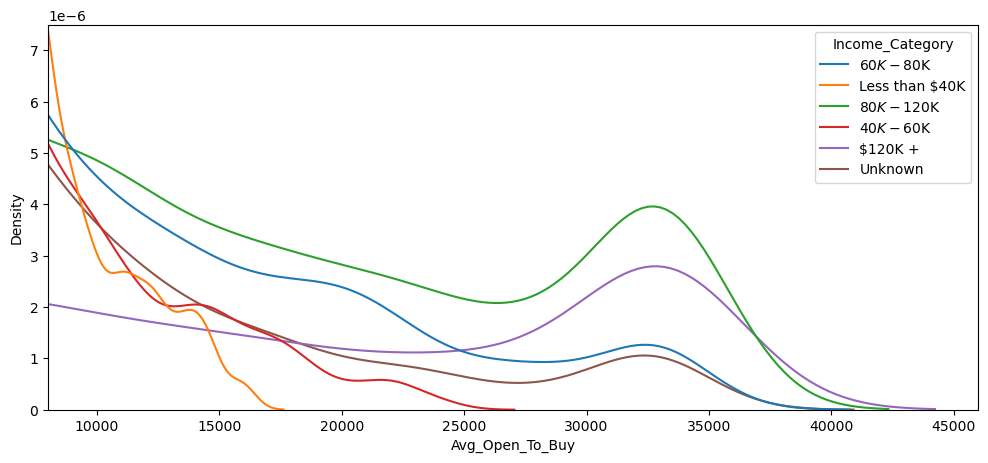

In [67]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Avg_Open_To_Buy', hue = 'Income_Category' )
plt.xlim(8000, 46000)
plt.ylim(0, 0.0000075);

 - **Inference:**

The magnified part shows the plot where the average opening balance is more than **8000 USD**

- The income group of **less than 60k USD** did not have opening balance beyond approx **25k USD**. 
- This part is mostly pre-shadowed by users from higher income groups with a lot of opening balance or unutilized amount.

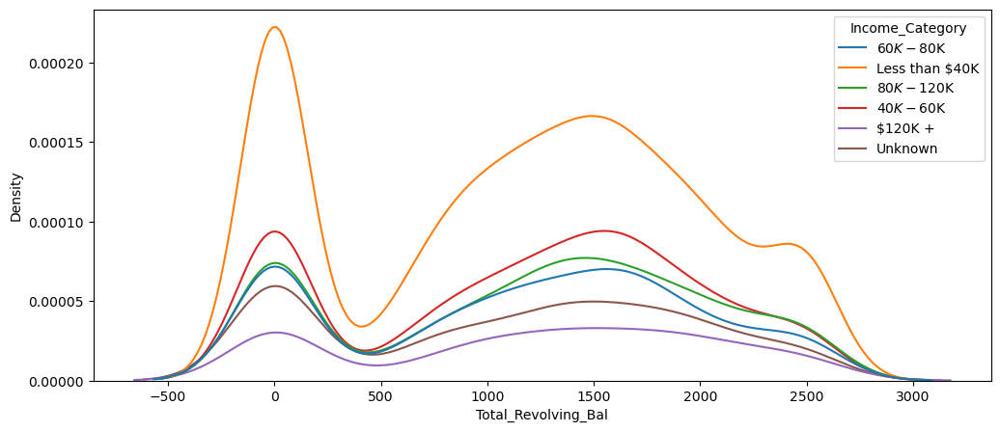

In [62]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Total_Revolving_Bal', hue = 'Income_Category' );

 - **Inference:**

The whole plot is bimodal

- The income group of **less than 60k USD** did not have opening balance beyond approx **25k USD**. 
- This part is mostly pre-shadowed by users from higher income groups with a lot of opening balance or unutilized amount.

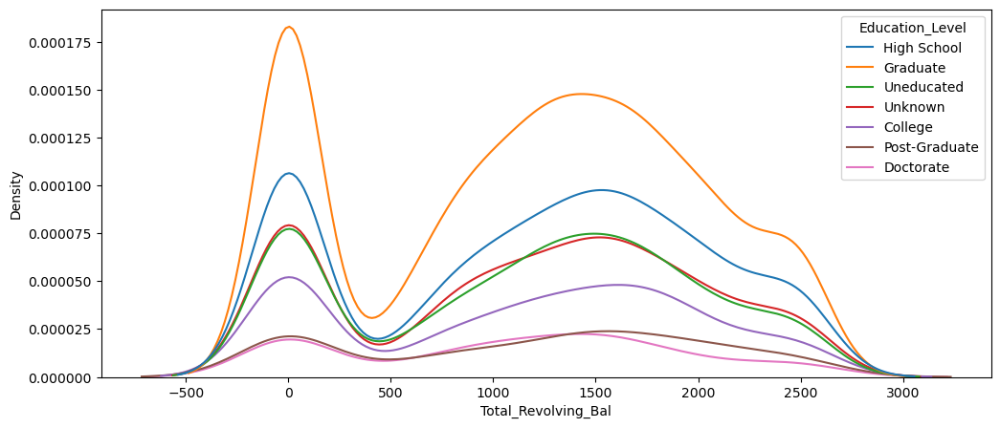

In [69]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Total_Revolving_Bal', hue = 'Education_Level' );

 - **Inference:**

The whole plot is seemingly bimodal

- Graduates are more dominant here followed by **High School** qualified, **uneducated people** etc and have due balances around **1000 - 2000 USD**  


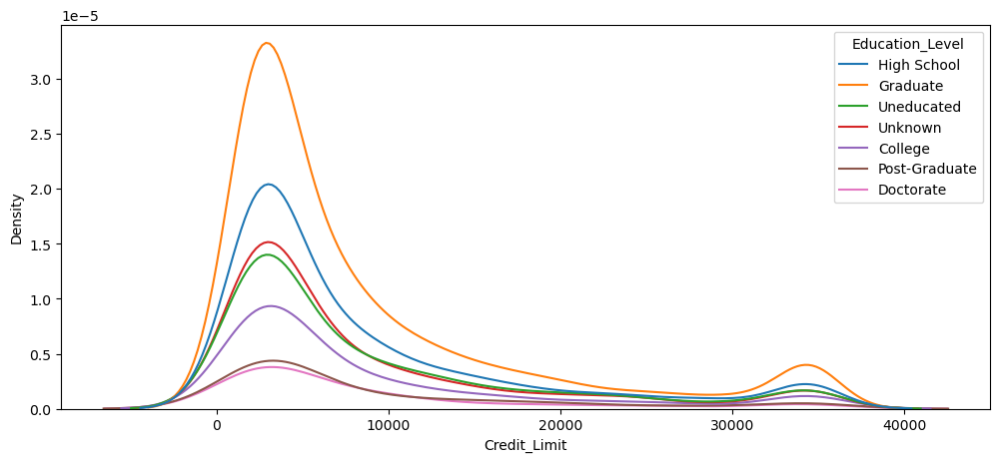

In [99]:
e1['Dependent_count'].apply(lambda x: str(x))
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Credit_Limit', hue = 'Education_Level' );

 - **Inference:**



- Graduates are more dominant here followed by **High School** qualified, **uneducated people**.
- The modal credit limit is close to **5000 USD**

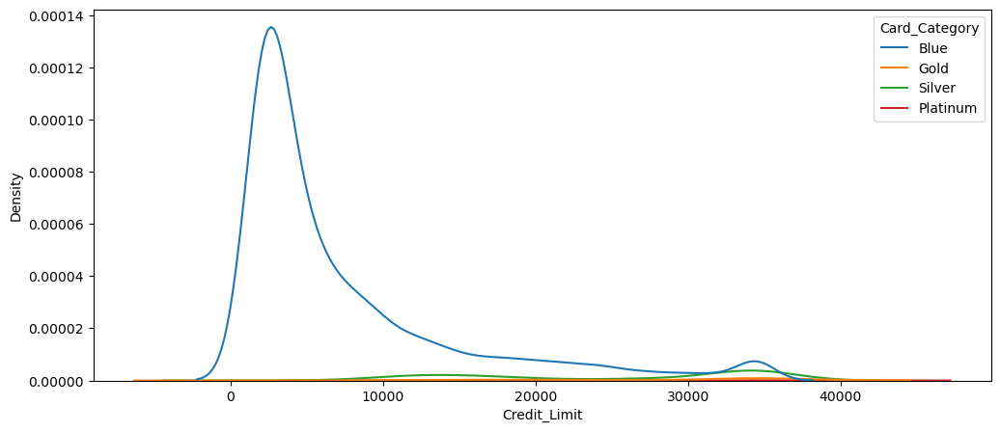

In [95]:
plt.figure(figsize = (12,5))
sns.kdeplot(data = e1, x = 'Credit_Limit', hue = 'Card_Category' );

 - **Inference:**


- **Blue** cards are heavily dominant here with credit limit below **10000 USD**


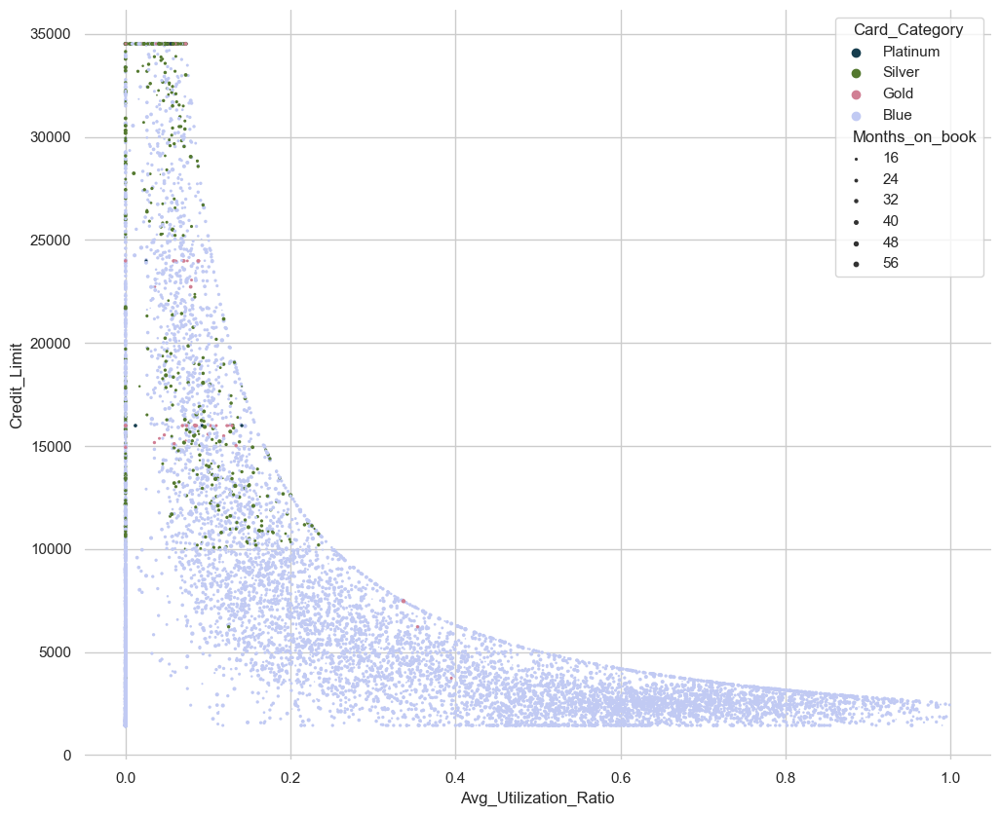

In [115]:
f, ax = plt.subplots(figsize=(12, 10))
sns.despine(f, left=True, bottom=True)
card_ranking = ["Blue", "Gold", "Silver", "Platinum"][::-1]
sns.scatterplot(x="Avg_Utilization_Ratio", y="Credit_Limit",
                hue="Card_Category", size="Months_on_book",
                palette="cubehelix",
                hue_order=card_ranking,
                sizes=(1, 10), linewidth=0,
                data=e1, ax=ax);

 - **Inference:**


- Here the key takeaway from the shape of the graph is that, there is a relationship between **Average_Utilisation_Ratio, Total Revolving Balanc  and Credit Limit**. 
     $$AUR = TRB / CL$$

- So, the credit limit is **inversely proportionate** with Average Utilisation Ratio

- Majority is the blue card holder.
- Other than the blue cards, mostly all of the other type of cards are less than **20%** exhausted.

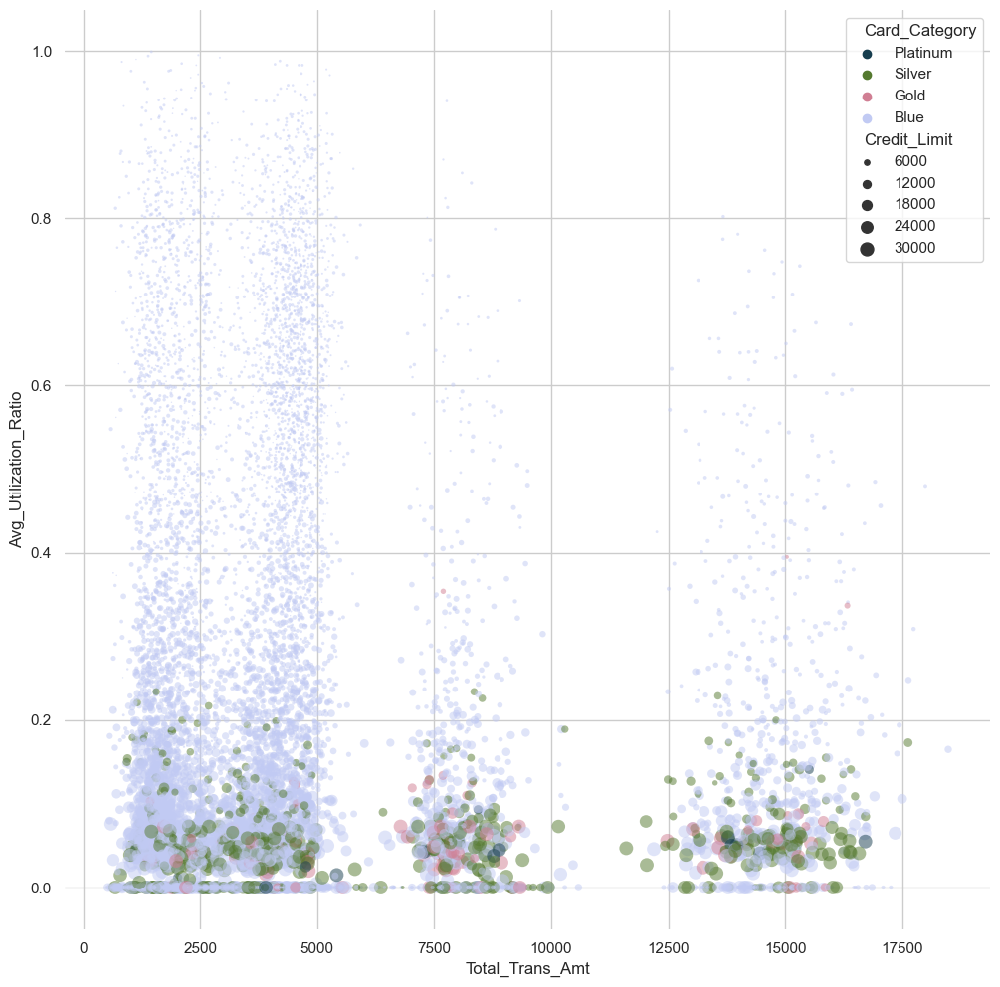

In [116]:
f, ax1 = plt.subplots(figsize=(12, 12))
sns.despine(f, left=True, bottom=True)
card_ranking = ["Blue", "Gold", "Silver", "Platinum"][::-1]
sns.scatterplot(x="Total_Trans_Amt", y="Avg_Utilization_Ratio",
                hue="Card_Category", size="Credit_Limit", alpha = 0.5,
                palette="cubehelix",
                hue_order=card_ranking,
                sizes=(1, 100), linewidth=0,
                data=e1,ax=ax1);

 - **Inference:**


- There is a clear division of the Total Transaction Amounts of the customers. **Under 5k USD, 7.5k - 10k USD, 12k - 17k USD**

- **Under 5k USD** 
    - **Blue cards** are heavily congested and are also utilized to the limit. Here Blue Cards under credit limit of **6k USD** are mostly utilized over **30%** . Even there are a lot of observations with over **80%** utilization.
    - **Silver, Gold and Platinum Cards** are utilized under **25%** with credit limit mostly over **8k USD.**
    
- **Between 7.5k - 10k USD** 
    - **Blue card** concentration is low but credit limit is higher than before. Still there are a lot of observations with low credit limit but higher transaction amount. That can be explained by the fact that, users with low limit blue card exhaust or utilize their card multiple times and by repay it to gain the limit again.
    - **Silver & Gold Cards** are roughly utilized under **20%** with credit limit mostly over **8k USD**. 
    - **Platinum Cards** are utilized under **15%** with credit limit mostly over **12k USD**.
    
- **Over 12.5k USD**
    - **Blue Card** concentration is lowest here. Here Blue Cards under credit limit of **6k USD** are utilized over **40%**
    - **Silver & Gold Cards** are roughly utilized under **20%** with even higher credit limits.
    - **Platinum Cards** are utilized under **15%** with credit limit mostly over **12k USD**.
    
 

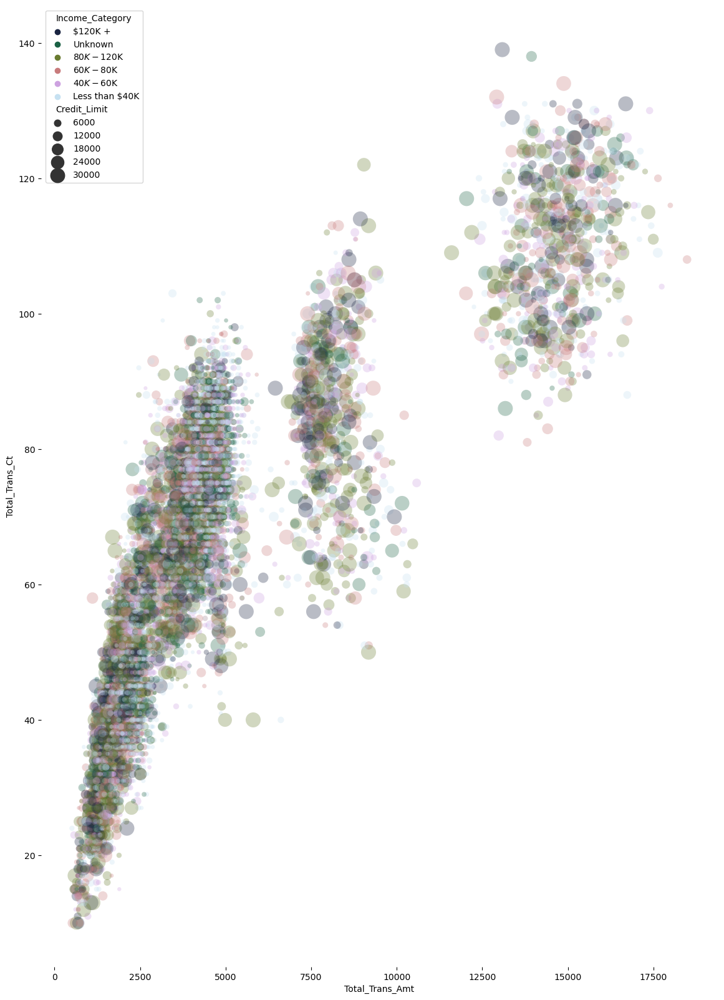

In [37]:
f, ax2 = plt.subplots(figsize=(14, 20))
sns.despine(f, left=True, bottom=True)
income_ranking = ["Less than $40K", "$40K - $60K","$60K - $80K", "$80K - $120K", "Unknown","$120K +"][::-1]
sns.scatterplot(x="Total_Trans_Amt", y="Total_Trans_Ct",
                hue="Income_Category", size="Credit_Limit",
                palette="cubehelix",
                hue_order=income_ranking,
                sizes=(20, 300), linewidth=0, alpha = 0.3,
                data=e1, ax=ax2);


 - **Inference:**


- There is a clear division of the Total Transaction Amounts of the customers -- **Under 5k, 7.5k - 12k** & **12.5k - 17k USD**

- **Under 5k USD** 
    - Density of people under this amount of usage is very high. So most of the customers from every income group has total annual transaction **below 5k USD**. But this region is populated by people with less than **40k USD** annual income and credit limit of **6k USD**. Number of transactions here are roughly between **10 - 100** times.
    
- **Between 7.5k - 10k USD** 
    - Here all the income groups accept less than **40k USD** are persistent. This region is dominated by people with income of more than **60k USD** and credit limit over **6k USD**. Number of transactions here are roughly between **55 - 120** times.
    
- **Between 12.5k - 17k USD**
    - This region is dominated by people with income of more than **80k USD** and credit limit over **10k USD**. Number of transactions here are roughly between **80 - 140** times.
    
 

# Income Distribution

In [107]:
e1['Income_Category'].value_counts()

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64

# Gender-wise Expense

/Users/sayantabiswas/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x500 with 0 Axes>

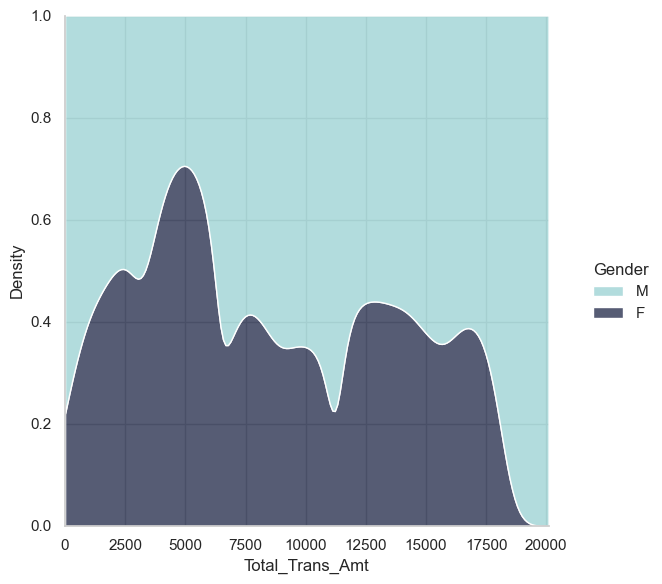

In [39]:
sns.set_theme(style="whitegrid")
plt.figure(figsize = (20,5))
sns.displot(
    data=e1,
    x="Total_Trans_Amt", hue="Gender",
    kind="kde", height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75");

- This plot here shows that no of male customers are more than female customers and most of them spent between **2.5k - 7.5k** in a year.

/Users/sayantabiswas/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x2000 with 0 Axes>

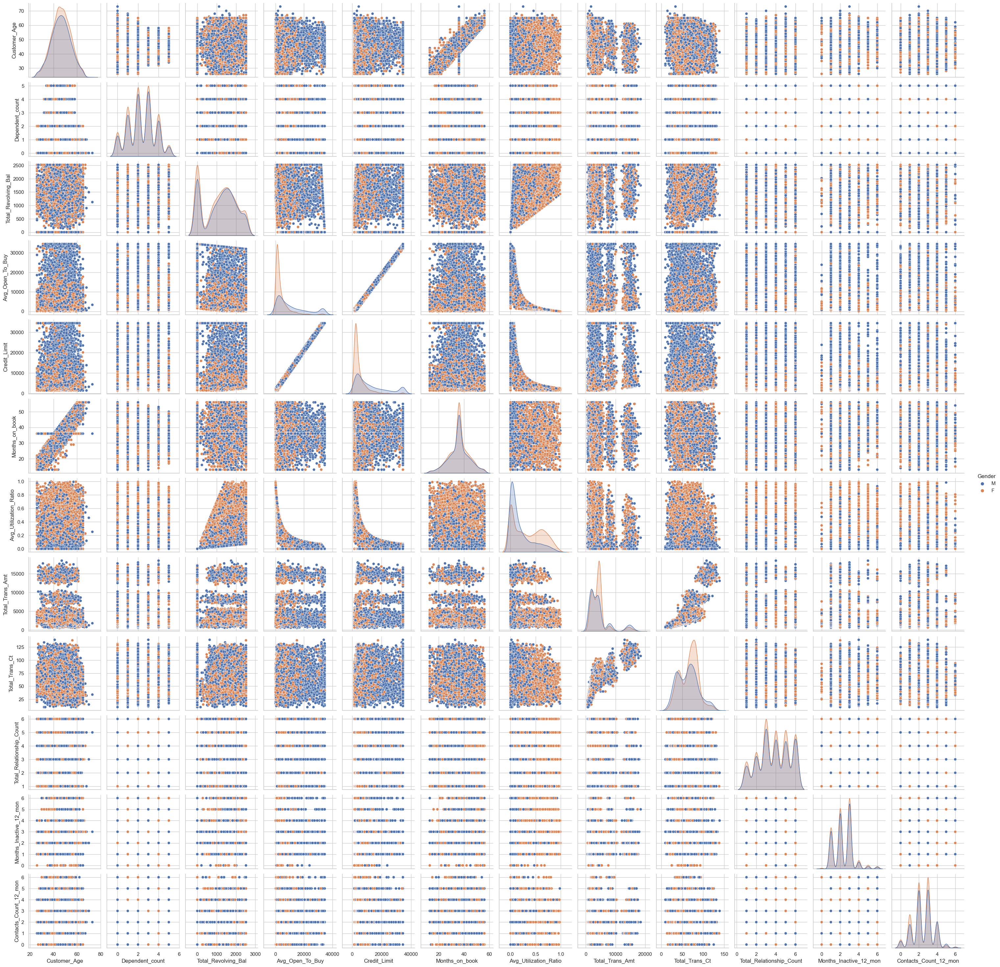

In [109]:
plt.figure(figsize = (20,20))
sns.pairplot(data = e1, hue = "Gender");

## Female and Male Customers (Total Transaction amount vs No of Transactions)

<Axes: xlabel='Total_Trans_Amt', ylabel='Total_Trans_Ct'>

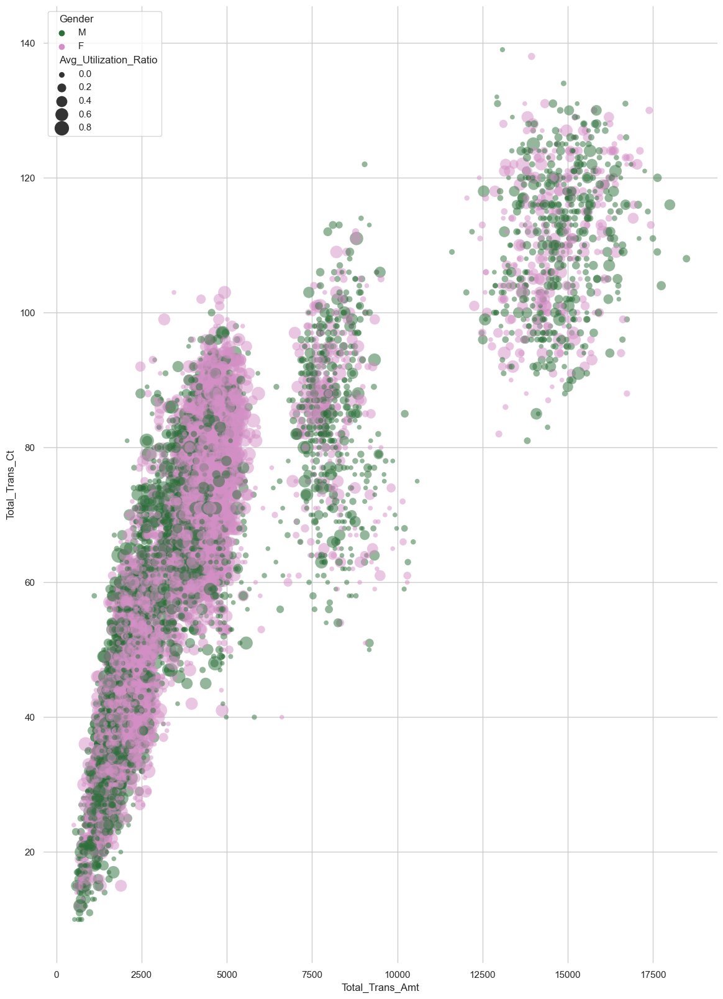

In [40]:
f, ax3 = plt.subplots(figsize=(14, 20))
sns.despine(f, left=True, bottom=True)
gender_ranking = ["M", "F"]#[::-1]
sns.scatterplot(x="Total_Trans_Amt", y="Total_Trans_Ct",
                hue="Gender", size="Avg_Utilization_Ratio",
                palette="cubehelix",
                hue_order=gender_ranking,
                sizes=(30,300), linewidth=0, alpha = 0.5,  #adjusting sizes of the dots
                data=e1, ax=ax3)
# Set x-axis limits
#ax3.set_xlim(10500, 18000) 

 - **Inference:**


- There is a clear division of the Total Transaction Amounts of the customers -- **Under 6k, 7.5k - 12k** & **12.5k - 17k USD**

- **Under 6k USD** 
    - Most of the female customers spent under **6k USD** and utilised their cards mostly over **60%**. This region is dominated by female customers in terms of density. Number of transactions here are roughly between **10 - 100** times.
- **Between 7.5k - 10k USD** 
    - Here, male customers are prominent. Utilization of cards here is less than **30%**. Number of transactions here are roughly between **60 - 110** times.
- **Between 12.5k - 17k USD**
    - Here both male and female customers are present with card utilization under **20%**. Number of transactions here are roughly between **85 - 135** times.
    
 

# People with Higher expenditure

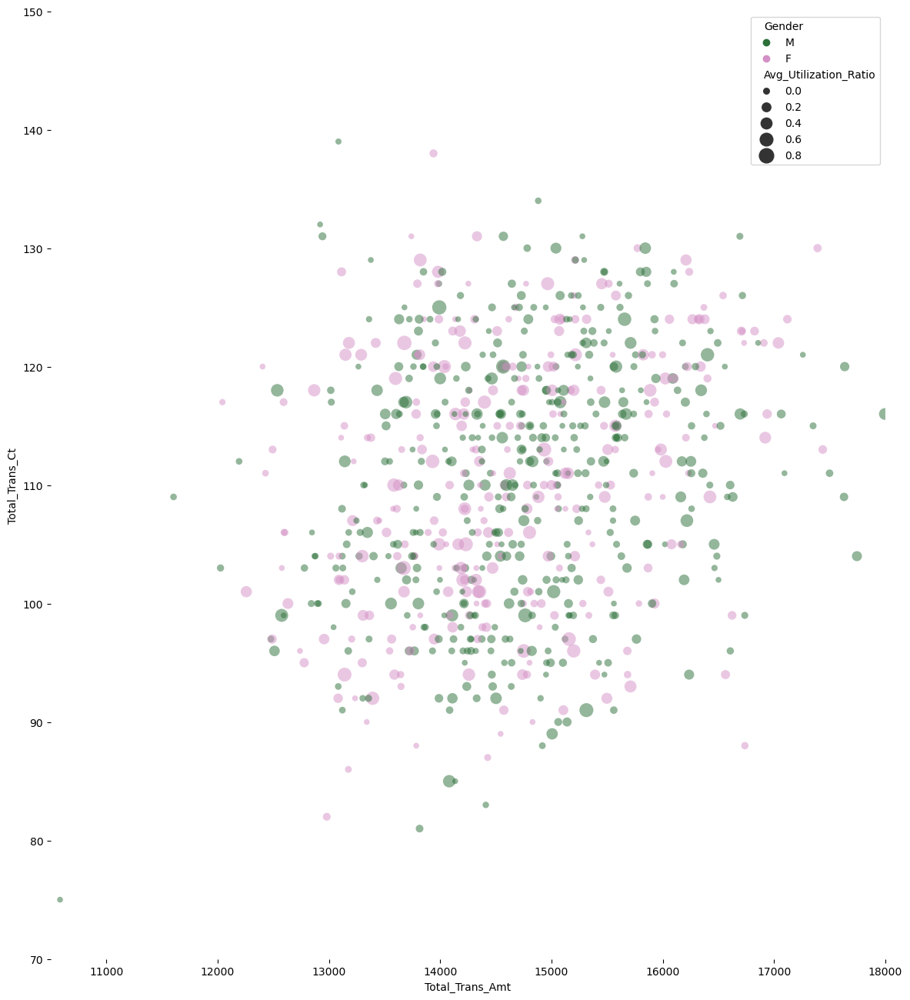

In [38]:
f, ax4 = plt.subplots(figsize=(14, 16))
sns.despine(f, left=True, bottom=True)
gender_ranking = ["M", "F"]#[::-1]
#vec = list(np.linspace(0, 1, 50)) #to adjust
sns.scatterplot(x="Total_Trans_Amt", y="Total_Trans_Ct",
                hue="Gender", size="Avg_Utilization_Ratio",
                palette="cubehelix",
                hue_order=gender_ranking,
                sizes=(30,220), linewidth=0, alpha = 0.5, #size_order = vec, #adjusting sizes of the dots
                data=e1, ax=ax4)

# Set x-axis limits
ax4.set_xlim(10500, 18000) 
ax4.set_ylim(70,150);

 - **Inferences:**
 
 - Here both male and female customers are present with card utilization under **20%**. But still it seems that, female customers have utilized their card more than the male customers. Because, this amount of expenditure is done by premium gold, silver or platinum cards. But we saw earlier that females use mostly blue card. Eventually that much expense with less credit limit pushes up their average card utilization ratio.
 

# No of Dependent Family Members

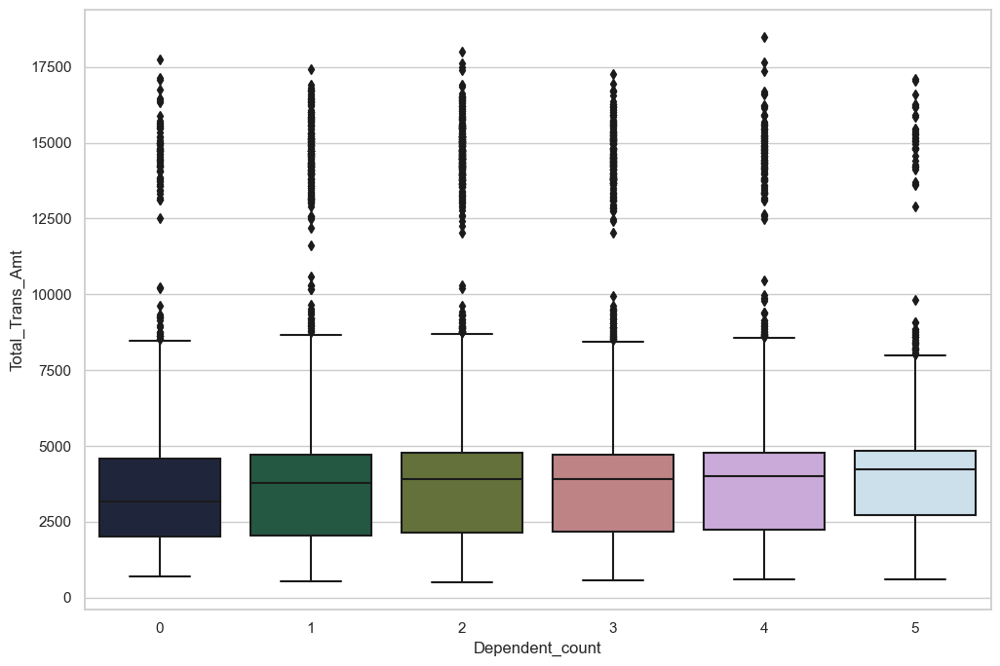

In [43]:
plt.figure(figsize=(12, 8))
sns.boxplot(x="Dependent_count", y="Total_Trans_Amt", data=e1, palette="cubehelix");

 - **Inferences:**
 
 - Here median expenses of families with members **0-5** are distributed as expected as individuals with more dependent family members have more median expenses. The spreads and outliers are also mostly identical.
 

# Age Distribution

In [52]:
age1 = e1['Customer_Age'].value_counts()
age2 = pd.DataFrame(age1)
age2.reset_index(inplace = True)

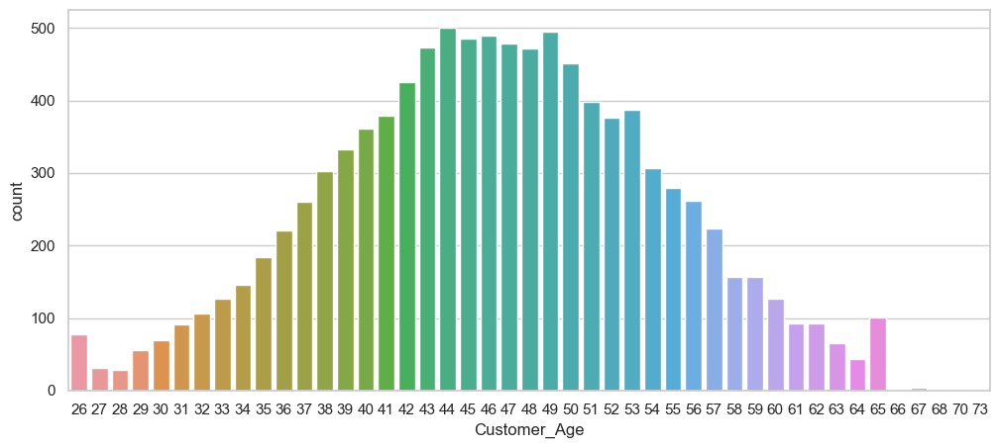

In [56]:
plt.figure(figsize = (12,5))
sns.barplot(data = age2, y = 'count', x = 'Customer_Age');

- **Inferences**

- Here ages of the customers are normally distributed. It is clear that people from age **30-60** years have the urge to use cards more than any other age group.

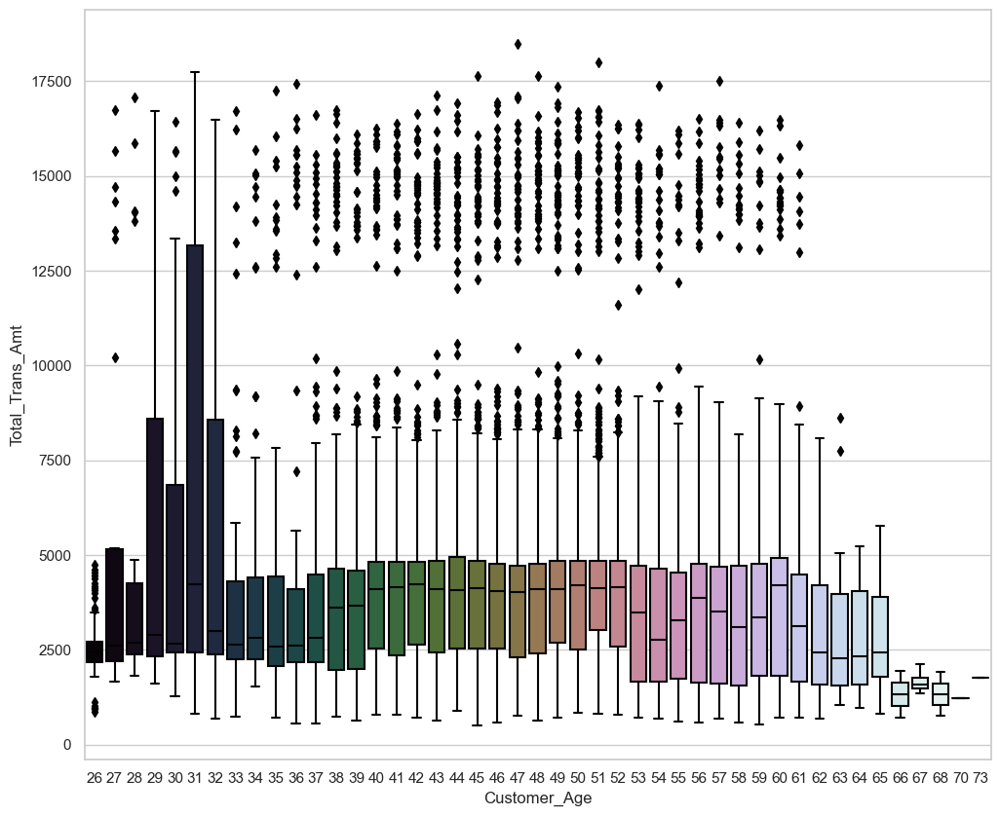

In [41]:
plt.figure(figsize=(12, 10))
sns.boxplot(x="Customer_Age", y="Total_Trans_Amt", data=e1, palette="cubehelix");

- **Inferences**

- Here ages of the customers are normally distributed. It is clear that people from age **30-60** years have the urge to use cards more than any other age group.

<Axes: xlabel='Card_Category', ylabel='Total_Trans_Amt'>

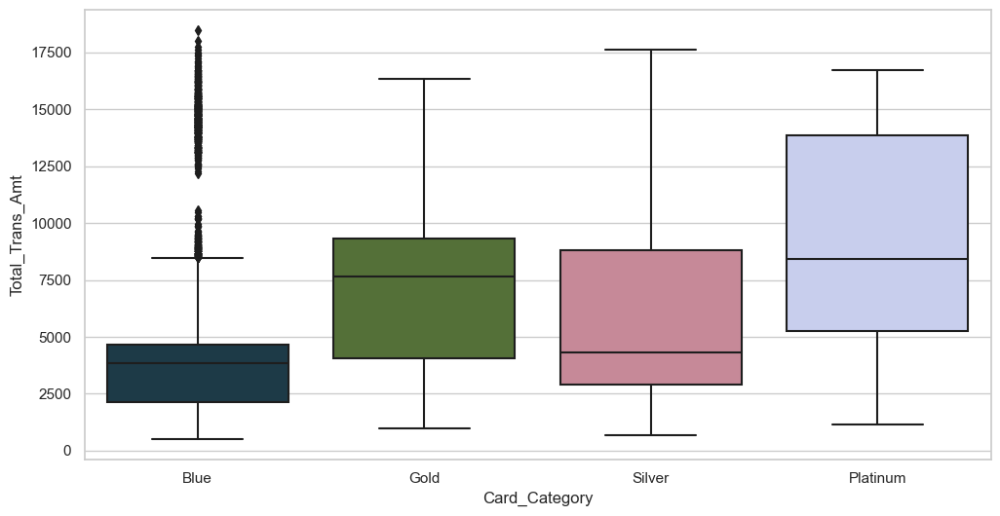

In [154]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="Card_Category", y="Total_Trans_Amt", data=e1, palette="cubehelix")

- **Inferences**

- Here the median transaction amount is highest for the platinum card holders and lowest is for blue card.


<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Amt'>

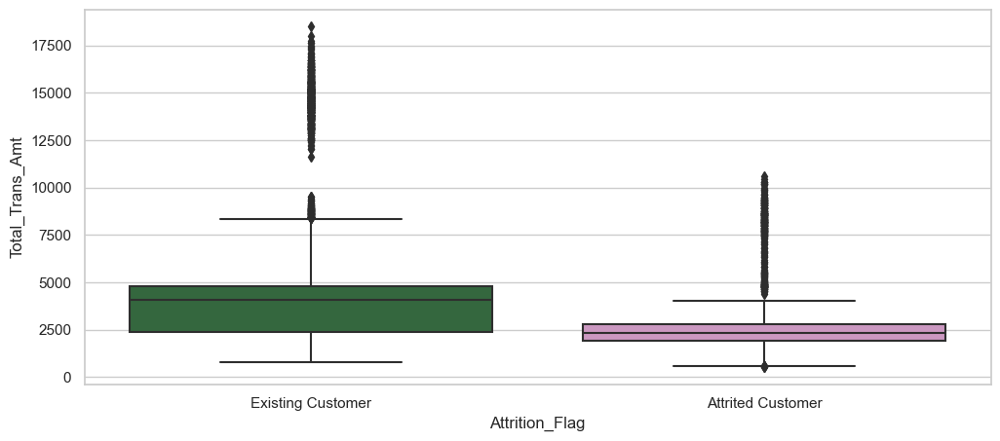

In [57]:
plt.figure(figsize=(12, 5))
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Amt", data=e1, palette="cubehelix")

- **Inferences**

- Here the median transaction amount is higher of the existing customers. The IQR for ex-customer is very low that means they mostly transacted for around **2500 USD**


<Axes: xlabel='Marital_Status', ylabel='Total_Trans_Amt'>

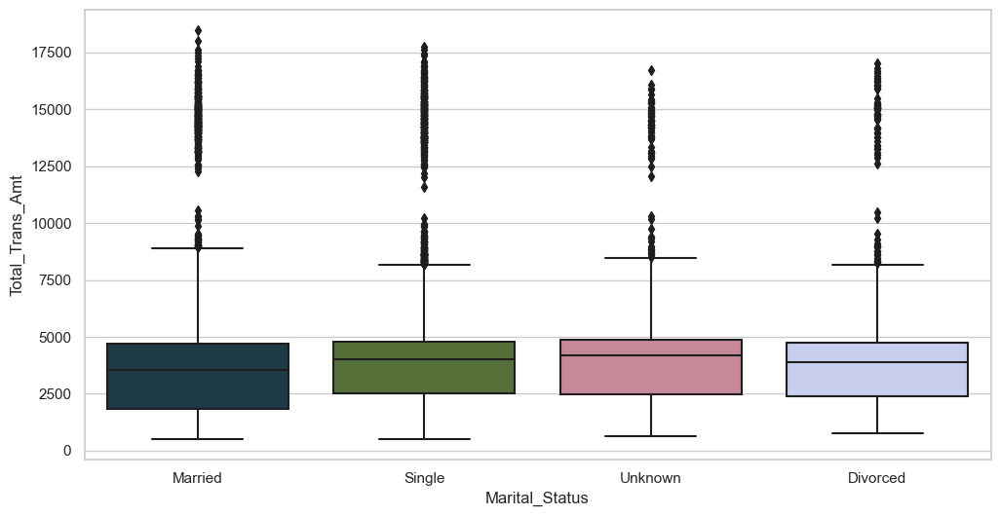

In [159]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="Marital_Status", y="Total_Trans_Amt", data=e1, palette="cubehelix")

<Axes: xlabel='Gender', ylabel='Total_Trans_Amt'>

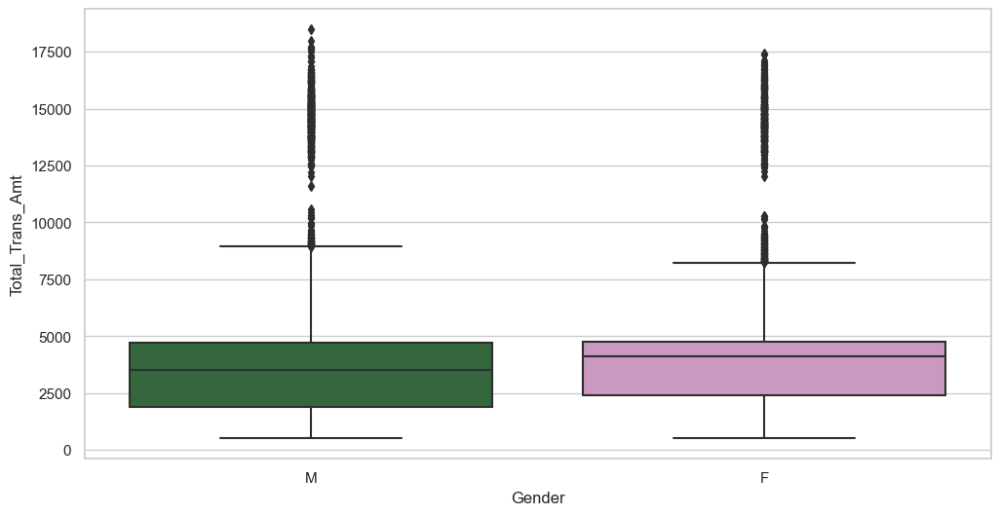

In [161]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="Gender", y="Total_Trans_Amt", data=e1, palette="cubehelix");

- **Inferences**

- Here the median transaction amount is higher of the existing customers. The IQR for ex-customer is very low that means they mostly transacted for around **2500 USD**


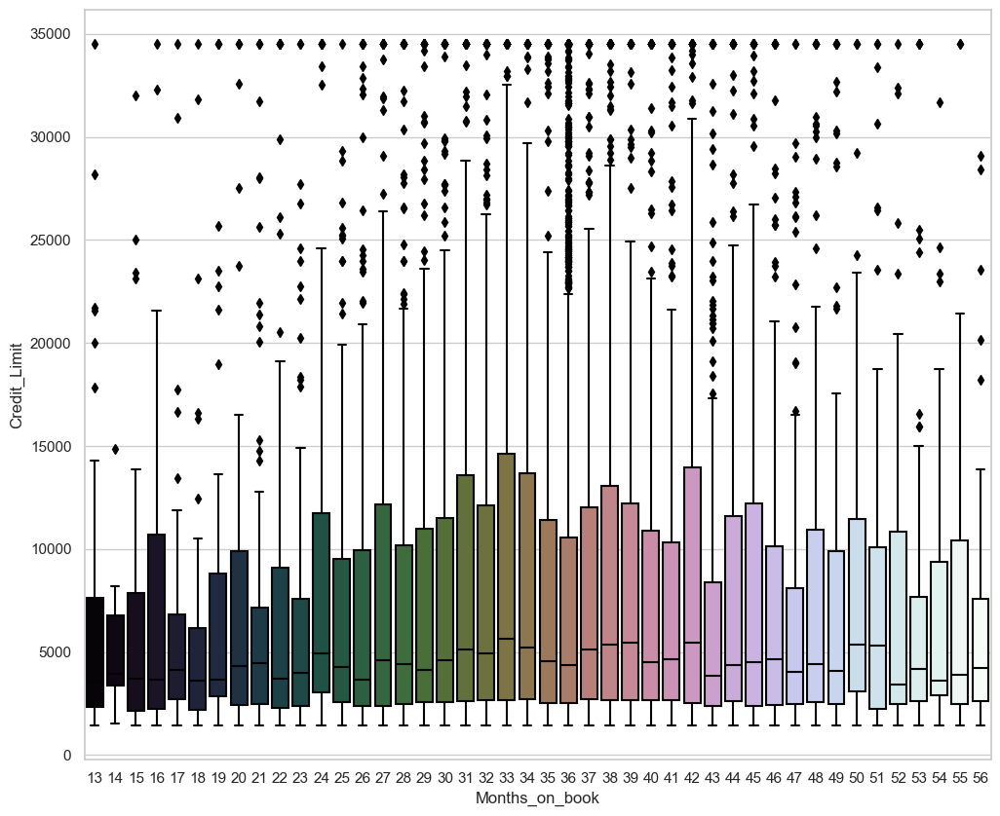

In [59]:
plt.figure(figsize=(12, 10))
sns.boxplot(x="Months_on_book", y="Credit_Limit", data=e1, palette="cubehelix");

In [60]:
e1

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Average_Amt_Per_Tran
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,27.238095
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,39.121212
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,94.350000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,58.550000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,29.142857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,132.273504
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,127.014493
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,171.516667
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,135.403226


# Genderwise Income Category vs Total transaction count

In [61]:
e1['Average_Amt_Per_Tran'] = e1['Total_Trans_Amt']/e1['Total_Trans_Ct']
e1

/var/folders/qr/9x6pfw9d58vf78nhsqtb93mh0000gn/T/ipykernel_819/2441558379.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  e1['Average_Amt_Per_Tran'] = e1['Total_Trans_Amt']/e1['Total_Trans_Ct']


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Average_Amt_Per_Tran
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,27.238095
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,39.121212
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,94.350000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,58.550000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,29.142857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,132.273504
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,127.014493
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,171.516667
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,135.403226


### Creating a new column 

In [62]:
in_trnc =  e1[['Gender', "Income_Category", "Total_Trans_Ct","Average_Amt_Per_Tran"]]
in_trnc1 = in_trnc.groupby(['Gender','Income_Category']).describe()


In [63]:
df=in_trnc
df

,Gender,Income_Category,Total_Trans_Ct,Average_Amt_Per_Tran
0,M,$60K - $80K,42,27.238095
1,F,Less than $40K,33,39.121212
2,M,$80K - $120K,20,94.350000
3,F,Less than $40K,20,58.550000
4,M,$60K - $80K,28,29.142857
...,...,...,...,...
10122,M,$40K - $60K,117,132.273504
10123,M,$40K - $60K,69,127.014493
10124,F,Less than $40K,60,171.516667
10125,M,$40K - $60K,62,135.403226


In [64]:
male = df[df['Gender'] == 'M']
quart = male.groupby(['Gender', 'Income_Category']).describe()

In [65]:
quart

Total_Trans_Ct                                     \
                                count       mean        std   min    25%   
Gender Income_Category                                                     
M      $120K +                  727.0  63.704264  25.750910  10.0  43.00   
       $40K - $60K              776.0  63.412371  25.262903  11.0  42.00   
       $60K - $80K             1402.0  63.247504  24.911737  10.0  42.00   
       $80K - $120K            1535.0  62.696417  24.838914  10.0  41.00   
       Less than $40K           277.0  64.054152  26.073210  13.0  43.00   
       Unknown                   52.0  60.230769  21.411574  24.0  42.75   

                                           Average_Amt_Per_Tran             \
                         50%    75%    max                count       mean   
Gender Income_Category                                                       
M      $120K +          64.0  81.00  139.0                727.0  63.662694   
       $40K - $60K      64.0  79.00  131.0                776.0  64.446022   
       $60K - $80K      65.0  79.00  134.0               1402.0  63.363468   
       $80K - $120K     63.0  79.00  127.0               1535.0  64.308113   
       Less than $40K   65.0  80.00  128.0                277.0  64.331510   
       Unknown          59.5  72.75  127.0                 52.0  54.679034   

                                                                               \
                              std        min        25%        50%        75%   
Gender Income_Category                                                          
M      $120K +          28.783407  26.508475  45.342330  54.175676  69.474638   
       $40K - $60K      30.839802  24.739130  44.932495  53.547065  69.422403   
       $60K - $80K      29.161938  19.137931  45.437899  54.985798  65.472783   
       $80K - $120K     30.183356  25.343284  45.219374  54.600000  67.899314   
       Less than $40K   31.095126  25.604938  45.611111  53.923077  66.014925   
       Unknown          16.940886  29.584416  43.884159  52.226343  60.083807   

                                    
                               max  
Gender Income_Category              
M      $120K +          170.978022  
       $40K - $60K      172.723404  
       $60K - $80K      180.058824  
       $80K - $120K     183.540000  
       Less than $40K   161.764706  
       Unknown          124.897638

In [66]:
quart1 = male.groupby(['Gender', 'Income_Category']).describe()['Average_Amt_Per_Tran']
up_male =quart1['75%']

In [67]:
up_male_75 = pd.DataFrame(up_male)
up_male_75.reset_index(inplace = True)
up_male_75

,Gender,Income_Category,75%
0,M,$120K +,69.474638
1,M,$40K - $60K,69.422403
2,M,$60K - $80K,65.472783
3,M,$80K - $120K,67.899314
4,M,Less than $40K,66.014925
5,M,Unknown,60.083807


In [68]:
quart2 = male.groupby(['Gender', 'Income_Category']).describe()['Average_Amt_Per_Tran']
low_male =quart1['25%']
low_male_25 = pd.DataFrame(low_male)
low_male_25.reset_index(inplace = True)

In [69]:
low_male_25

,Gender,Income_Category,25%
0,M,$120K +,45.342330
1,M,$40K - $60K,44.932495
2,M,$60K - $80K,45.437899
3,M,$80K - $120K,45.219374
4,M,Less than $40K,45.611111
5,M,Unknown,43.884159


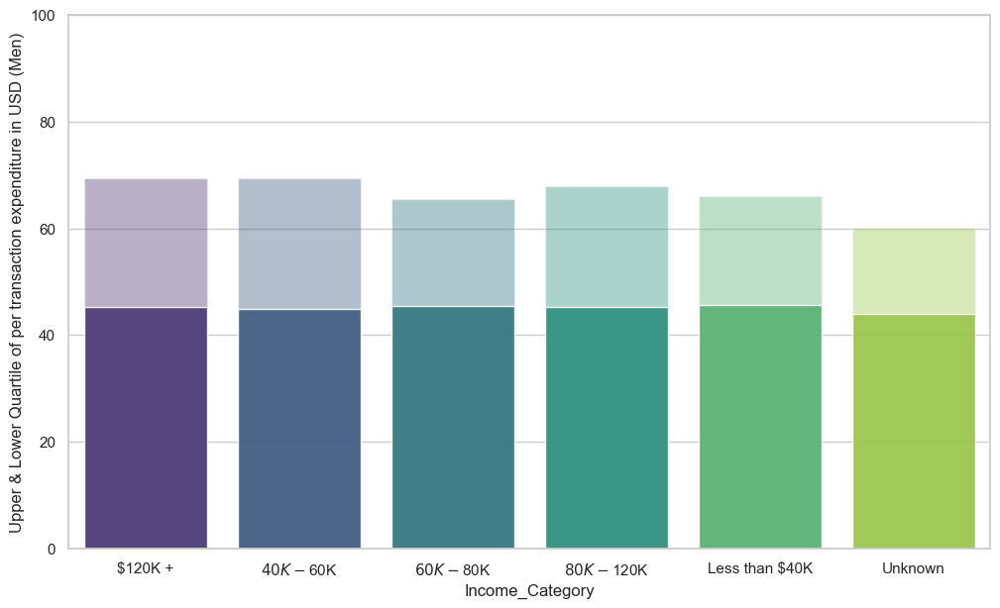

In [70]:
plt.figure(figsize = (12,7))
sns.barplot(data = up_male_75, y = '75%', 
            x = 'Income_Category', palette = 'viridis', alpha = 0.4)
sns.barplot(data = low_male_25, y = '25%', 
            x = 'Income_Category', palette = 'viridis', alpha = 0.9)
plt.ylim(0,100)
plt.ylabel('Upper & Lower Quartile of per transaction expenditure in USD (Men)');

#### Here the IQR is also visible.

## Upper Quartile & Lower Quartile Expense (per income group)(Female)

In [71]:
fem = df[df['Gender'] == 'F']
qu3 = fem.groupby(['Gender', 'Income_Category']).describe()['Average_Amt_Per_Tran']
qu3

count       mean        std        min        25%  \
Gender Income_Category                                                       
F      $40K - $60K      1014.0  61.163852  22.369084  26.836066  49.829025   
       Less than $40K   3284.0  61.687834  23.250600  21.250000  49.328947   
       Unknown          1060.0  61.293798  22.778924  26.789474  49.717865   

                              50%        75%         max  
Gender Income_Category                                    
F      $40K - $60K      56.767578  64.279503  168.445652  
       Less than $40K   56.666667  64.990854  190.193182  
       Unknown          56.500145  64.177229  166.000000

In [72]:
low_f =qu3['25%']
low_f_25 = pd.DataFrame(low_f)
low_f_25.reset_index(inplace = True)
low_f_25

,Gender,Income_Category,25%
0,F,$40K - $60K,49.829025
1,F,Less than $40K,49.328947
2,F,Unknown,49.717865


In [73]:
high_f =qu3['75%']
high_f_75 = pd.DataFrame(high_f)
high_f_75.reset_index(inplace = True)
high_f_75

,Gender,Income_Category,75%
0,F,$40K - $60K,64.279503
1,F,Less than $40K,64.990854
2,F,Unknown,64.177229


(0.0, 100.0)

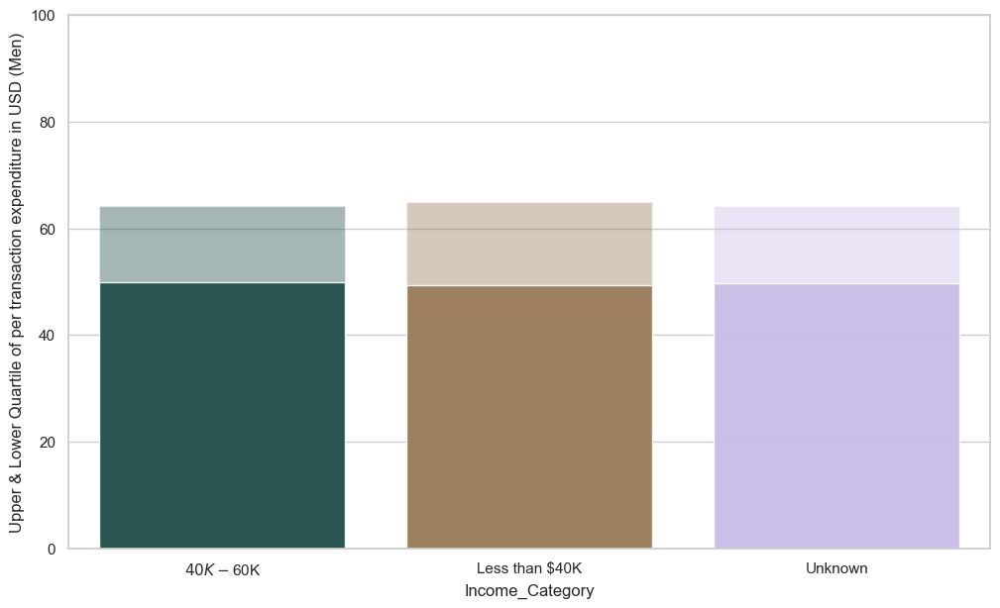

In [74]:
plt.figure(figsize = (12,7))
sns.barplot(data = high_f_75, y = '75%', 
            x = 'Income_Category', palette = 'cubehelix', alpha = 0.4)
sns.barplot(data = low_f_25, y = '25%', 
            x = 'Income_Category', palette = 'cubehelix', alpha = 0.9)
plt.ylabel('Upper & Lower Quartile of per transaction expenditure in USD (Men)')
plt.ylim(0,100)

## Median Expense per transaction (Male vs Female)

In [75]:
quart2 = male.groupby(['Gender', 'Income_Category']).describe()['Average_Amt_Per_Tran']
median_male =quart1['50%']
med_m = pd.DataFrame(median_male)
med_m.reset_index(inplace = True)
med_m

,Gender,Income_Category,50%
0,M,$120K +,54.175676
1,M,$40K - $60K,53.547065
2,M,$60K - $80K,54.985798
3,M,$80K - $120K,54.600000
4,M,Less than $40K,53.923077
5,M,Unknown,52.226343


Here we have to drop unnecessary rows like the income groups "80𝐾− 120K, 60𝐾− 80K and more than $120K" as there are no females with this income in the dataset.	

In [76]:
med_m1 = med_m.iloc[1:6]
med_m2 = med_m1.drop(3)
med_m3 = med_m2.drop(2)
med_m3

,Gender,Income_Category,50%
1,M,$40K - $60K,53.547065
4,M,Less than $40K,53.923077
5,M,Unknown,52.226343


In [77]:
qu3 = fem.groupby(['Gender', 'Income_Category']).describe()['Average_Amt_Per_Tran']
median_female =qu3['50%']
med_f = pd.DataFrame(median_female)
med_f.reset_index(inplace = True)
med_f

,Gender,Income_Category,50%
0,F,$40K - $60K,56.767578
1,F,Less than $40K,56.666667
2,F,Unknown,56.500145


(0.0, 100.0)

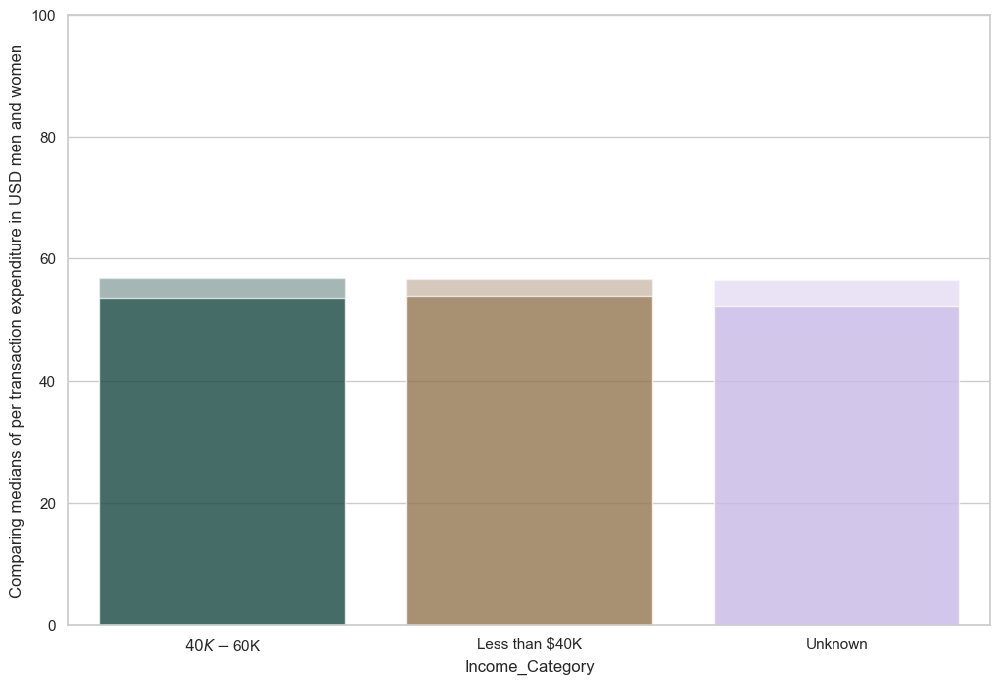

In [78]:
plt.figure(figsize = (12,8))
sns.barplot(data = med_f, y = '50%', 
            x = 'Income_Category', palette = 'cubehelix', alpha = 0.4)
sns.barplot(data = med_m3, y = '50%', 
            x = 'Income_Category', palette = 'cubehelix', alpha = 0.7)
plt.ylabel('Comparing medians of per transaction expenditure in USD men and women')
plt.ylim(0,100)

Surprisingly, the median expense per transaction of females here shows up to be greater than that of the males

# Per Month Transactions and Amounts


Here we will try to find the coloumn with the

In [79]:
e1['Months_Active'] = e1['Months_Inactive_12_mon'].apply(lambda x: (12-x) )


In [80]:
e1['Tran_per_month'] = e1['Total_Trans_Ct']/e1['Months_Active']


In [81]:
e1['Expense_Per_Active_Month'] = e1['Total_Trans_Amt']/e1['Months_Active']

In [82]:
e1.head(3)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Average_Amt_Per_Tran,Months_Active,Tran_per_month,Expense_Per_Active_Month
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,11914.0,1.335,1144,42,1.625,0.061,27.238095,11,3.818182,104.000000
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,7392.0,1.541,1291,33,3.714,0.105,39.121212,11,3.000000,117.363636
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,2.594,1887,20,2.333,0.000,94.350000,11,1.818182,171.545455


# Expense per Active Month (Card Type)

In [83]:
e1.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Average_Amt_Per_Tran', 'Months_Active', 'Tran_per_month',
       'Expense_Per_Active_Month'],
      dtype='object')

In [84]:
card_month = e1[['Card_Category', 'Expense_Per_Active_Month']]

In [85]:
cm1 = card_month.groupby(['Card_Category']).median()
cm2 = card_month.groupby(['Card_Category']).mean()
cm = pd.merge(cm1, cm2, on = 'Card_Category', how = 'outer')
cm.columns = ['Expense_Per_Active_Month_Median', 'Expense_Per_Active_Month_Mean'] #changing col names
cm.reset_index(inplace = True)
cm

,Card_Category,Expense_Per_Active_Month_Median,Expense_Per_Active_Month_Mean
0,Blue,387.894444,441.957175
1,Gold,763.350000,809.077049
2,Platinum,848.622222,937.438068
3,Silver,448.555556,680.904958


Text(0, 0.5, 'Expense per Active Month by Card Type (Mean & Median)')

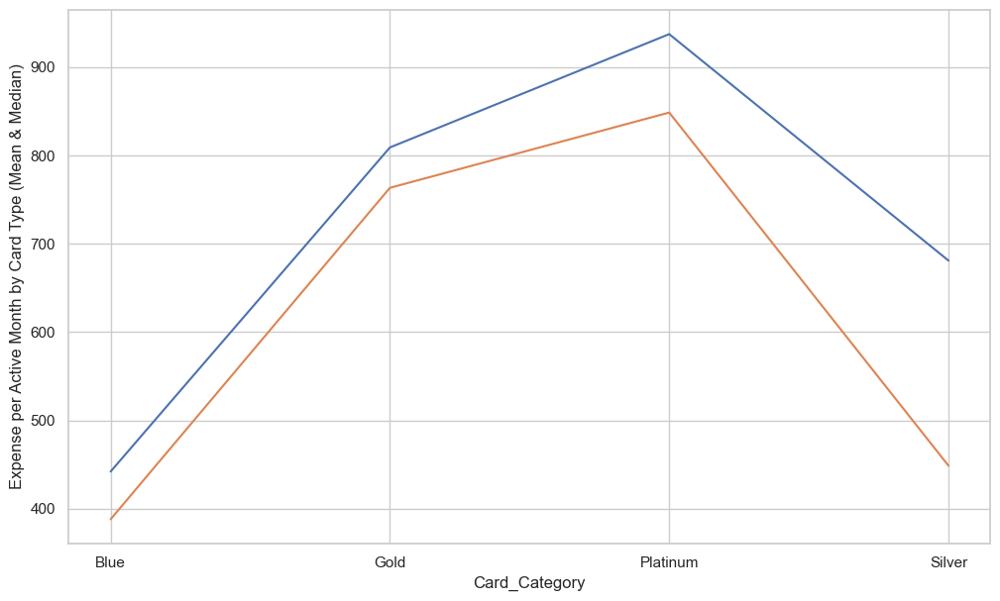

In [86]:
plt.figure(figsize = (12,7))
sns.lineplot(data = cm, x = 'Card_Category', y = 'Expense_Per_Active_Month_Mean')
sns.lineplot(data = cm, x = 'Card_Category', y = 'Expense_Per_Active_Month_Median')
plt.ylabel('Expense per Active Month by Card Type (Mean & Median)')


# Expense Per Active Month (Attrited vs Existing)

In [87]:
attr_month = e1[['Attrition_Flag', 'Expense_Per_Active_Month']]

In [88]:
attr_month.sample(3)

,Attrition_Flag,Expense_Per_Active_Month
8414,Existing Customer,492.600000
5235,Existing Customer,448.090909
8437,Existing Customer,556.777778


In [89]:
att1 = attr_month.groupby('Attrition_Flag').median()
att2 = attr_month.groupby('Attrition_Flag').mean()
att = pd.merge(att1, att2, on = 'Attrition_Flag', how = 'outer')
att.columns = ['Expense_Per_Active_Month_Median', 'Expense_Per_Active_Month_Mean'] #changing col names
att.reset_index(inplace = True)
att

,Attrition_Flag,Expense_Per_Active_Month_Median,Expense_Per_Active_Month_Mean
0,Attrited Customer,252.444444,335.263166
1,Existing Customer,414.472222,484.157492


(0.0, 800.0)

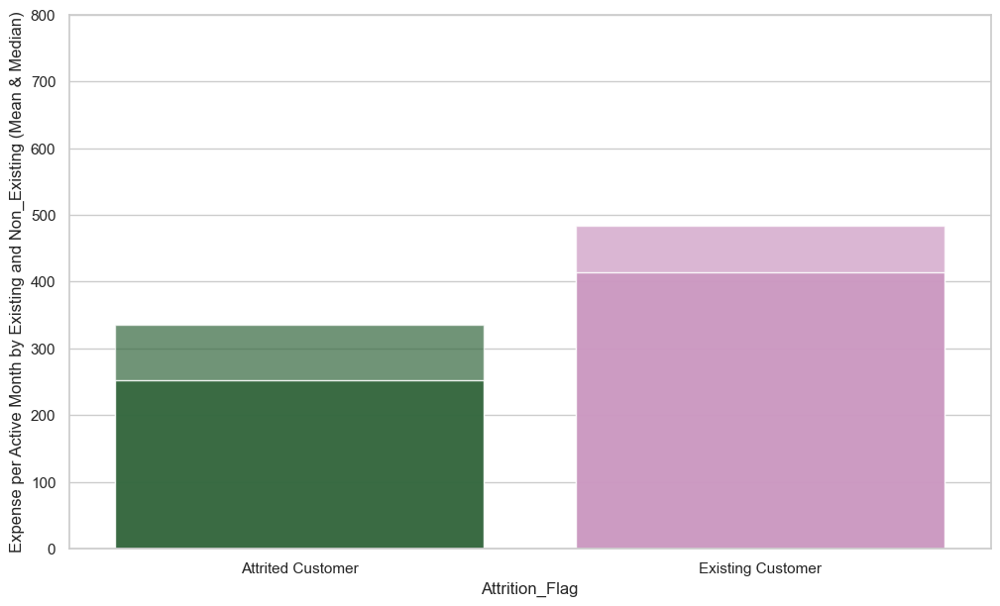

In [90]:
plt.figure(figsize = (12,7))
sns.barplot(data = att, x = 'Attrition_Flag', y = 'Expense_Per_Active_Month_Mean', alpha = 0.7,
           palette = 'cubehelix')
sns.barplot(data = att, x = 'Attrition_Flag', y = 'Expense_Per_Active_Month_Median', palette = 'cubehelix',
           alpha = 0.9)
plt.ylabel('Expense per Active Month by Existing and Non_Existing (Mean & Median)')
plt.ylim(0,800)